# PascalX trial
Documentation: https://bergmannlab.github.io/PascalX/usage.html

In [1]:
from PascalX import genescorer
from pathlib import Path
import pandas as pd
import subprocess as sp
# Initialize scorer
Scorer = genescorer.chi2sum(window = 10000)

In [2]:
cores = 4

# Files
ref_panel = "../Data/Reference/GRCh38/30x_tped/EUR.30x-GRCh38"
gene_ref = "../Data/PascalX/resources/limix_annotation_strand.tsv"

keepfile = None

summ_stats = {
    "mono_c": "path/to/data/Mono_count_GWAS.tsv.gz"  # Count of monocytes per unit volume of blood
}

PASCALX_DIR = Path("../Data/PascalX")
SCDRS_DIR = Path("../Data/SCDRS")

mono_marker_genes = ["CTSS", "FCN1", "NEAT1", "LYZ", "PSAP", "S100A9", "AIF1", "MNDA", "SERPINA1", "TYROBP"]

### 1. Load reference panel

In [3]:
Scorer.load_refpanel(
    ref_panel,
    parallel = cores,
    keepfile = keepfile,
) 

### 2. Load gene annotations

In [4]:
Scorer.load_genome(
    file = gene_ref,
    ccol = 1,       # Column containing chromosome number
    cid = 4,        # Column containing gene id
    csymb = 0,      # Column containing gene symbol
    cstx = 2,       # Column containing transcription start
    cetx = 3,       # Column containing transcription end
    cs = 6,         # Column containing strand
    chrStart = 0,   # Number of leading characters to skip in ccol
    splitchr = "\t",
    header = True
    )

33461 active genes


### 3. Load GWAS summary statistics

In [5]:
trait = "mono_c"
Scorer.load_GWAS(
    summ_stats[trait], 
    rscol = 4,   # rsID column
    pcol = 2,    # p-values 
    bcol = 10,   # betas
    header=True, 
    delimiter="\t"
)

    A1 A2     p        se             variant         bp  chromosome   
0  TTA  T  0.75  0.003796          rs55663920  105564218          10  \
1  AAT  A  0.27  0.004941  10:106475328:AAT:A  106475327          10   
2  CTG  C  0.57  0.008900  10:106518896:CTG:C  106518894          10   
3  GAA  G  0.22  0.002132         rs775740081  108409297          10   
4  TTA  T  0.93  0.006054  10:112897510:TTA:T  112897510          10   

  str_allele1 str_allele2  variant_index      beta  
0         TTA           T       32108349  0.001194  
1         AAT           A       32124470  0.005434  
2         CTG           C       32125254  0.005055  
3         GAA           G       32161355  0.002640  
4         TTA           T       32245285  0.000561  
286 SNPs cutoff to 1e-300
8753887 SNPs loaded


### 4. Load eQTL mapping

In [7]:
eqtl_file = "../Data/PascalX/resources/eqtl_rsid_intersect.tsv"
Scorer.load_mapping(eqtl_file, rcol=0, gcol=1, delimiter='\t', header=True, joint=True, symbol=False)

6499 gene to SNP mappings loaded (# SNPs: 904665)


#### Gene-wise visualization of GWAS SNPs  (optional)

Window size: 10000
Chr: 2
# SNP: 718


({0: ['rs6542833', 0.74],
  1: ['rs6729151', 0.22],
  2: ['rs10196218', 0.23],
  3: ['rs12622931', 0.25],
  4: ['rs10460485', 0.26],
  5: ['rs150837377', 0.25],
  6: ['rs6737760', 0.26],
  7: ['rs7577636', 0.26],
  8: ['rs13428808', 0.26],
  9: ['rs12477450', 0.26],
  10: ['rs1514916', 0.27],
  11: ['rs10210711', 0.27],
  12: ['rs190236428', 0.27],
  13: ['rs5008045', 0.28],
  14: ['rs7420869', 0.26],
  15: ['rs1016124', 0.41],
  16: ['rs13392306', 0.26],
  17: ['rs10177696', 0.26],
  18: ['rs58666702', 0.25],
  19: ['rs60024860', 0.25],
  20: ['rs41445250', 0.26],
  21: ['rs13410406', 0.26],
  22: ['rs10194177', 0.26],
  23: ['rs6740656', 0.27],
  24: ['rs10173832', 0.27],
  25: ['rs6733957', 0.26],
  26: ['rs150645077', 0.25],
  27: ['rs74262331', 0.3],
  28: ['rs79937004', 0.29],
  29: ['rs75929090', 0.48],
  30: ['rs11899659', 0.081],
  31: ['rs13391794', 0.28],
  32: ['rs10199267', 0.28],
  33: ['rs34852807', 0.081],
  34: ['rs13012495', 0.079],
  35: ['rs7601040', 0.35],
  36: ['

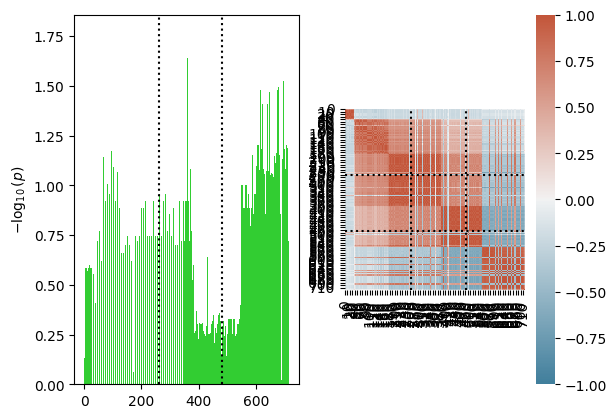

In [8]:
Scorer.plot_genesnps('TSGA10', mark_window=True, show_correlation=True)

### 4. Score Genes
*Example usage:*

All genes:
  
  `R = Scorer.score_all()`

Score only genes on chromosomes 21 and 22:

  `R = Scorer.score_chr(chrs=[21,22])`

Score the genes WDR12 and FARP2:

  `R = Scorer.score(['WDR12','FARP2'])`


In [6]:
R = Scorer.score_chr(chrs=[1])

Scoring with method saddle
 

  0%|           [ estimated time left: ? ] 

/usr/local/lib/python3.8/dist-packages/numpy-1.24.2-py3.8-linux-x86_64.egg/numpy/lib/function_base.py:2846: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.8/dist-packages/numpy-1.24.2-py3.8-linux-x86_64.egg/numpy/lib/function_base.py:2705: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.8/dist-packages/numpy-1.24.2-py3.8-linux-x86_64.egg/numpy/lib/function_base.py:2705: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


48 genes scored
3102 genes can not be scored (check annotation)
[time]: 213.5s; 14.76 genes/s


In [21]:
eqtl_file = "/groups/umcg-franke-scrna/tmp02/projects/multiome/ongoing/sc-scoring-student-project/scScoring/Data/PascalX/resources/eqtl_rsid_intersect.tsv"
f = open(eqtl_file, "r")
f.readline()

c = 0
s = 0
for line in f:
    line = line.rstrip().split('\t')
    print(line[0])

rs138873029
rs11236244
rs138873029
rs11236244
rs138873029
rs11236244
rs138873029
rs11236244
rs138873029
rs11236244
rs138873029
rs11236244
rs138873029
rs11236244
rs138873029
rs11236244
rs138873029
rs11236244
rs138873029
rs11236244
rs4944061
rs4944061
rs4944061
rs4944061
rs4944061
rs4944061
rs4944061
rs4944061
rs4944061
rs4944061
rs4944950
rs4944950
rs4944950
rs4944950
rs4944950
rs4944950
rs4944950
rs4944950
rs4944950
rs4944950
rs12576129
rs12576129
rs12576129
rs12576129
rs12576129
rs12576129
rs12576129
rs12576129
rs12576129
rs12576129
rs34895688
rs34895688
rs34895688
rs34895688
rs34895688
rs34895688
rs34895688
rs34895688
rs34895688
rs34895688
rs17133461
rs17133461
rs17133461
rs17133461
rs17133461
rs17133461
rs17133461
rs17133461
rs17133461
rs17133461
rs919022516
rs61894779
rs919022516
rs61894779
rs919022516
rs61894779
rs919022516
rs61894779
rs919022516
rs61894779
rs919022516
rs61894779
rs919022516
rs61894779
rs919022516
rs61894779
rs919022516
rs61894779
rs919022516
rs61894779
rs4483614


rs66889039
rs66889039
rs66889039
rs66889039
rs66889039
rs66889039
rs66889039
rs66889039
rs2757050
rs2757050
rs2757050
rs2757050
rs2757050
rs2757050
rs2757050
rs2757050
rs2757050
rs1590257
rs1590257
rs1590257
rs1590257
rs1590257
rs1590257
rs1590257
rs1590257
rs1590257
rs1187530
rs1187530
rs1187530
rs1187530
rs1187530
rs1187530
rs1187530
rs1187530
rs1187530
rs13157797
rs13157797
rs13157797
rs13157797
rs13157797
rs13157797
rs13157797
rs13157797
rs13157797
rs13157797
rs13157797
rs66971305
rs66971305
rs66971305
rs66971305
rs66971305
rs66971305
rs66971305
rs66971305
rs66971305
rs66971305
rs66971305
rs1819333
rs1819333
rs1819333
rs1819333
rs1819333
rs1819333
rs1819333
rs1819333
rs1819333
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs37332
rs187879261
rs40198
rs77193193
rs40198
rs77193193
rs40198
rs77193193
rs40198
rs771

rs10946203
rs10946203
rs10946203
rs10946203
rs10946203
rs10946203
rs10946203
rs10946203
rs826678
rs826678
rs826678
rs826678
rs826678
rs826678
rs826678
9:43023844:C:A
rs2281779
rs76464812
9:43023844:C:A
rs2281779
rs76464812
9:43023844:C:A
rs2281779
rs76464812
9:43023844:C:A
rs2281779
rs76464812
9:43023844:C:A
rs2281779
rs76464812
rs11691112
rs552051426
rs11691112
rs552051426
rs11691112
rs552051426
rs11691112
rs552051426
rs11691112
rs552051426
rs11691112
rs552051426
rs11691112
rs552051426
rs2617438
rs2617438
rs2617438
rs2617438
rs2617438
rs2617438
rs2617438
rs2617438
rs2617438
rs2617438
rs9594866
rs9594866
rs9594866
rs9594866
rs9594866
rs9594866
rs112258224
rs112258224
rs112258224
rs112258224
rs112258224
rs112258224
rs111884657
rs111884657
rs111884657
rs111884657
rs111884657
rs111884657
rs57870706
rs57870706
rs57870706
rs57870706
rs57870706
rs57870706
rs2549778
rs2549778
rs2549778
rs2549778
rs2549778
rs2549778
rs2549778
rs2549778
rs2549778
rs2549778
rs61074976
rs61074976
rs61074976
rs610

rs10504479
rs10504479
rs35109143
rs35109143
rs35109143
rs35109143
rs35109143
rs35109143
rs35109143
rs62431534
rs62431534
rs62431534
rs62431534
rs62431534
rs6472551
rs6472551
rs6472551
rs6472551
rs6472551
rs6472551
rs6472551
rs6472551
rs6472551
rs6472551
rs11996338
rs11996338
rs11996338
rs11996338
rs11996338
rs11996338
rs11996338
rs11996338
rs11996338
rs11996338
rs62059194
rs62059194
rs62059194
rs62059194
rs62059194
rs62059194
rs8005990
rs8005990
rs8005990
rs8005990
rs8005990
rs8005990
rs8005990
rs6572585
rs6572585
rs6572585
rs6572585
rs6572585
rs6572585
rs6572585
rs7159307
rs7159307
rs7159307
rs7159307
rs7159307
rs7159307
rs7159307
rs17689585
rs17689585
rs17689585
rs17689585
rs17689585
rs17689585
rs17689585
rs17689585
rs17689585
rs17689585
rs13256204
rs13256204
rs13256204
rs13256204
rs13256204
rs13256204
rs13256204
rs13256204
rs13256204
rs13256204
rs9321502
rs9321502
rs9321502
rs9321502
rs9321502
rs9321502
rs343909
rs343909
rs343909
rs4900927
rs4900927
rs4900927
rs4900927
rs4900927
rs4

rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs867134961
rs7591772
rs7591772
rs7591772
rs7591772
rs7591772
rs7591772
rs7591772
rs7591772
rs6961156
rs6961156
rs6961156
rs6961156
rs6961156
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs2839203
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs12626184
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs2839202
rs115363276
rs28

rs56029211
rs56029211
rs2421021
rs2421021
rs2306391
rs2306391
rs2306391
rs2306391
rs2306391
rs2306391
rs2306391
rs2306391
rs2306391
rs550980
rs144357522
rs550980
rs144357522
rs550980
rs144357522
rs550980
rs144357522
rs550980
rs144357522
rs550980
rs144357522
rs550980
rs144357522
rs550980
rs144357522
rs550980
rs144357522
rs550980
rs144357522
rs7084349
rs7084349
rs7084718
rs7084718
rs62506036
rs62506036
rs62506036
rs62506036
rs62506036
rs62506036
rs62506036
rs7068487
rs7068487
rs12787021
rs12787021
rs12787021
rs12787021
rs12787021
rs12787021
rs12787021
rs7998351
rs7998351
rs7998351
rs7998351
rs7998351
rs10001793
rs10001793
rs10001793
rs10001793
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs35398273
rs552701099
rs1004946
rs552701099
rs1004946
rs7587037
rs7587037
rs7587037
rs7587037
rs7587037
rs7587037
rs7587037
rs7587037
rs7587037
rs10887145
rs10887145
rs7902176
rs790217

rs530392127
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs6717723
rs10069691
rs10069691
rs10069691
rs10069691
rs10069691
rs10069691
rs10069691
rs541739146
rs1788229
rs541739146
rs1788229
rs541739146
rs1788229
rs541739146
rs1788229
rs541739146
rs1788229
rs12038474
rs11667274
rs12038474
rs11667274
rs12038474
rs11667274
rs12038474
rs11667274
rs12038474
rs11667274
rs12038474
rs11667274
rs7712994
rs7712994
rs7712994
rs7712994
rs7712994
rs7712994
rs7712994
rs10052366
rs10052366
rs10052366
rs10052366
rs10052366
rs10052366
rs10052366
rs10051747
rs10051747
rs10051747
rs10051747
rs10051747
rs10051747
rs4321720
rs4321720
rs4321720
rs4321720
rs4321720
rs4321720
rs4321720
rs13026928
rs756412517
rs13026928
rs756412517
rs13026928
rs756412517
rs13026928
rs756412517
rs13026928
rs756412517
rs13026928
rs756412517
rs13026928
rs756412517
rs13026928
rs756412517
rs13026928
rs756412517
rs13026928
rs756412517
rs1302

rs59125181
rs7604224
rs7604224
rs7604224
rs7612211
rs7612211
rs7612211
rs7612211
rs7612211
rs7612211
rs7612211
rs7612211
rs7612211
rs7612211
rs6789860
rs6789860
rs6789860
rs6789860
rs6789860
rs6789860
rs6789860
rs6789860
rs6789860
rs6789860
rs542169149
rs660339
rs542169149
rs660339
rs542169149
rs660339
rs542169149
rs660339
rs542169149
rs660339
rs542169149
rs660339
rs542169149
rs660339
rs2024532
rs2024532
rs2024532
rs2024532
rs10121612
rs10121612
rs10121612
rs10121612
rs10121612
rs6871900
rs6871900
rs6871900
rs6871900
rs2076439
rs2076439
rs2076439
rs2076439
rs2076439
rs2076439
rs2076439
rs2076439
rs2076439
rs6795182
rs6795182
rs6795182
rs6795182
rs6795182
rs6795182
rs6795182
rs6795182
rs6795182
rs6795182
rs6771049
rs6771049
rs6771049
rs6771049
rs6771049
rs6771049
rs6771049
rs6771049
rs6771049
rs6771049
rs11385481
rs11385481
rs11385481
rs11385481
rs11385481
rs11385481
rs11385481
rs11385481
rs11385481
rs11385481
rs3934935
rs3934935
rs3934935
rs3934935
rs3934935
rs3934935
rs3934935
rs39349

rs546867364
rs56829278
rs546867364
rs56829278
rs546867364
rs56829278
rs546867364
rs56829278
rs546867364
rs56829278
rs546867364
rs56829278
rs11870965
rs11870965
rs11870965
rs11870965
rs11870965
rs11870965
rs11870965
rs11870965
rs11870965
rs11870965
rs11870965
rs2720462
rs2720462
rs2720462
rs2720462
rs2720462
rs2720462
rs2720462
rs2720462
rs2720462
rs2720462
rs2720462
rs12709365
rs12709365
rs12709365
rs12709365
rs12709365
rs12709365
rs12709365
rs12709365
rs12709365
rs12709365
rs12709365
rs13380815
rs13380815
rs13380815
rs13380815
rs13380815
rs13380815
rs13380815
rs13380815
rs13380815
rs13380815
rs13380815
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs9905959
rs796232853
rs1162366594
rs67

rs10710372
rs10710372
rs10710372
rs10710372
rs10710372
rs10710372
rs10710372
rs10710372
rs11688028
rs11688028
rs11688028
rs34344781
rs34344781
rs34344781
rs34344781
rs34344781
rs34344781
rs34344781
rs34344781
rs34344781
rs4699051
rs4699051
rs4699051
rs4699051
rs4699051
rs4699051
rs4699051
rs4699051
rs4699051
rs4699051
rs4699051
rs11323350
rs11323350
rs11323350
rs11323350
rs11323350
rs2186899
rs2186899
rs2186899
rs2186899
rs2186899
rs10794034
rs10794034
rs10794034
rs10794034
rs10794034
rs10794034
rs10794034
rs10794034
rs10794034
rs10794034
rs2847171
rs2847171
rs2847171
rs2847171
rs2847171
rs1268608
rs1268608
rs1268608
rs1268608
rs1268608
rs1268608
rs1268608
rs1268608
rs6815783
rs6815783
rs6815783
rs6815783
rs6815783
rs6815783
rs6815783
rs6815783
rs6815783
rs6815783
rs17671352
rs17671352
rs17671352
rs17671352
rs17671352
rs17671352
rs17671352
rs17671352
rs17671352
rs17671352
rs17671352
rs9901146
rs9901146
rs9901146
rs9901146
rs9901146
rs9901146
rs9901146
rs9901146
rs9901146
rs9901146
rs99

rs1916000
rs1916000
rs1916000
rs1916000
rs1916000
rs1916000
rs1916000
rs1257004
rs1257004
rs1257004
rs1257004
rs1257004
rs1257004
rs1257004
rs1257004
rs1257004
rs55870241
rs55870241
rs55870241
rs55870241
rs55870241
rs55870241
rs1796054
rs1796054
rs1796054
rs1796054
rs1796054
rs1796054
rs1796054
rs1796054
rs1796054
rs1669762
rs549897217
rs1669762
rs549897217
rs1669762
rs549897217
rs1669762
rs549897217
rs1669762
rs549897217
rs1669762
rs549897217
rs1669762
rs549897217
rs1669762
rs549897217
rs1669762
rs549897217
rs1257006
rs1257006
rs1257006
rs1257006
rs1257006
rs1257006
rs1257006
rs1257006
rs1257006
rs1257005
rs1257005
rs1257005
rs1257005
rs1257005
rs1257005
rs1257005
rs1257005
rs1257005
rs1257119
rs1257119
rs1257119
rs1257119
rs1257119
rs1257119
rs1257119
rs1257119
rs1257119
rs1148595
rs1148595
rs1148595
rs1148595
rs1148595
rs1148595
rs1148595
rs1148595
rs1148595
rs1148594
rs1148594
rs1148594
rs1148594
rs1148594
rs1148594
rs1148594
rs1148594
rs1148594
rs2612088
rs2612088
rs2612088
rs2612

rs4809329
rs4809329
rs4809329
rs4809329
rs4809329
rs4809329
rs4809329
rs2454454
rs2454454
rs2454454
rs2454454
rs2454454
rs2454454
rs2454454
rs2454454
rs2454454
rs10936613
rs10936613
rs10936613
rs7605218
rs7605218
rs7605218
rs7605218
rs7605218
rs7605218
rs7605218
rs7605218
rs7605218
rs7605218
rs7605218
rs7605218
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs2309521
rs145105922
rs4297937
rs4297937
rs4297937
rs4297937
rs4297937
rs4297937
rs4297937
rs4297937
rs4297937
rs4297937
rs4297937
rs4297937
rs2309454
rs2309454
rs2309454
rs2309454
rs2309454
rs2309454
rs2309454
rs2309454
rs2309454
rs2309454
rs2309454
rs2309454
rs6710938
rs4578904
rs1572136
rs4578904
rs1572136
rs4578904
rs1572136
rs4578904
rs1572136
rs4578904
rs1572136
rs4578904
rs1572136
rs4578904
rs1572136
rs4578904
rs1572136
rs4578904
rs1

rs2243552
rs138464171
rs2243552
rs138464171
rs2243552
rs138464171
rs2243552
rs138464171
rs2243552
rs138464171
rs2243552
rs138464171
rs2243552
rs138464171
rs2243552
rs1796050
rs1796050
rs1796050
rs1796050
rs1796050
rs1796050
rs1796050
rs1796050
rs1796050
rs10192426
rs569430574
rs10192426
rs569430574
rs10192426
rs569430574
rs10192426
rs569430574
rs10192426
rs569430574
rs10192426
rs569430574
rs10192426
rs569430574
rs6787395
rs6787395
rs6787395
rs6787395
rs1446674
rs181743550
rs1446674
rs181743550
rs1446674
rs181743550
rs1446674
rs181743550
rs1446674
rs181743550
rs1446674
rs181743550
rs1446674
rs181743550
rs60954211
rs60954211
rs60954211
rs60954211
rs60954211
rs1758205
rs1758205
rs1758205
rs1758205
rs1758205
rs1758205
rs1758205
rs1758205
rs1842847
rs2263805
rs1842847
rs2263805
rs1842847
rs2263805
rs1842847
rs2263805
rs1842847
rs2263805
rs1842847
rs2263805
rs1842847
rs2263805
rs1842847
rs2263805
rs189516392
rs62457285
rs189516392
rs62457285
rs189516392
rs62457285
rs189516392
rs62457285
rs18

rs10241352
rs10241352
rs227051
rs227051
rs227051
rs227051
rs227051
rs227051
rs227051
rs227051
rs227051
rs227051
rs227045
rs227045
rs227045
rs227045
rs227045
rs227045
rs227045
rs227045
rs227045
rs227045
rs2149019
rs2149019
rs2149019
rs2149019
rs2149019
rs2149019
rs2149019
rs2149019
rs2149019
rs2297202
rs2297202
rs2297202
rs41288947
rs41288947
rs41288947
rs41288947
rs11137025
rs11137025
rs11137025
rs11137026
rs11137026
rs11137026
rs227095
rs227095
rs227095
rs227095
rs227095
rs227095
rs227095
rs227095
rs227095
rs227095
rs1650823
rs1650823
rs4111114
rs4111114
rs4111114
rs13406000
rs190659966
rs13406000
rs190659966
rs13406000
rs190659966
rs13406000
rs190659966
rs13406000
rs190659966
rs13406000
rs190659966
rs397967218
rs397967218
rs397967218
rs397967218
rs397967218
rs397967218
rs397967218
rs397967218
rs397967218
rs397967218
rs3856257
rs3856257
rs3856257
rs676729
rs676729
rs676729
rs676729
rs676729
rs676729
rs676729
rs676729
rs676729
rs676729
rs4698875
rs185319455
rs4698875
rs185319455
rs4698

rs4859414
rs4859414
rs6844097
rs1263838955
rs6844097
rs1263838955
rs6844097
rs1263838955
rs6844097
rs1263838955
rs6844097
rs1263838955
rs6844097
rs1263838955
rs11319980
rs11319980
rs11319980
rs11319980
rs11319980
rs11319980
rs6532093
rs200224022
rs6532093
rs200224022
rs6532093
rs200224022
rs6532093
rs200224022
rs6532093
rs200224022
rs6532093
rs200224022
rs4859589
rs4859589
rs4859589
rs4859589
rs4859589
rs4859589
rs4859590
rs4859590
rs4859590
rs4859590
rs4859590
rs4859590
rs4859591
rs4859591
rs4859591
rs4859591
rs4859591
rs4859591
rs4241579
rs4241579
rs4241579
rs4241579
rs4241579
rs4241579
rs6818470
rs6818470
rs6818470
rs6818470
rs6818470
rs6818470
rs6819920
rs6819920
rs6819920
rs6819920
rs6819920
rs6819920
rs35479416
rs35479416
rs35479416
rs35479416
rs35479416
rs35479416
rs35479416
rs35479416
rs35479416
rs6852075
rs6852075
rs6852075
rs6852075
rs6852075
rs6852075
rs6856958
rs6856958
rs6856958
rs6856958
rs6856958
rs6856958
rs5859487
rs5859487
rs5859487
rs5859487
rs5859487
rs5859487
rs581

rs13128319
rs13128319
rs13128319
rs11349732
rs529955956
rs11144734
rs11349732
rs529955956
rs11144734
rs11349732
rs529955956
rs11144734
rs11349732
rs529955956
rs11144734
rs11349732
rs529955956
rs11144734
rs11349732
rs529955956
rs11144734
rs6532161
rs6532161
rs6532161
rs6532161
rs6532161
rs6532161
rs4484329
rs150107457
rs4484329
rs150107457
rs4484329
rs150107457
rs4484329
rs150107457
rs4484329
rs150107457
rs4484329
rs150107457
rs4550961
rs4550961
rs4550961
rs4550961
rs4550961
rs4550961
rs4380549
rs4380549
rs4380549
rs4380549
rs4380549
rs4380549
rs6532160
rs6532160
rs6532160
rs6532160
rs6532160
rs6532160
rs4422436
rs4422436
rs4422436
rs4422436
rs4422436
rs4422436
rs6532158
rs6532158
rs6532158
rs6532158
rs6532158
rs6532158
rs6532159
rs6532159
rs6532159
rs6532159
rs6532159
rs6532159
rs11393494
rs11393494
rs11393494
rs11393494
rs11393494
rs11393494
rs200212909
rs200212909
rs200212909
rs200212909
rs200212909
rs200212909
rs7655350
rs7655350
rs7655350
rs7655350
rs7655350
rs7655350
rs4401475
rs4

rs28796954
rs7634375
rs28796954
rs7634375
rs28796954
rs7634375
rs28796954
rs7634375
rs28796954
rs7634375
rs28796954
rs7634375
rs28796954
rs7634375
rs28796954
rs7634375
rs28796954
rs17078813
rs17078813
rs17078813
rs17078813
rs17078813
rs17078813
rs17078813
rs17078813
rs17078813
rs17078813
rs17078813
rs17078813
rs12490249
rs12490249
rs12490249
rs12490249
rs12490249
rs12490249
rs12490249
rs12490249
rs12490249
rs12490249
rs12490249
rs12490249
rs4404788
rs4404788
rs4404788
rs4404788
rs4404788
rs1713067
rs1713067
rs2910103
rs2910103
rs2910103
rs35339599
rs35339599
rs35339599
rs35339599
rs35339599
rs35339599
rs35339599
rs35339599
rs141733506
rs141733506
rs141733506
rs141733506
rs141733506
rs141733506
rs141733506
rs141733506
rs141733506
rs141733506
rs141733506
rs141733506
rs9375698
rs9375698
rs9375698
rs9375698
rs9375698
rs376912999
rs4279458
rs376912999
rs4279458
rs376912999
rs4279458
rs376912999
rs4279458
rs376912999
rs4279458
rs4321845
rs4321845
rs4321845
rs4321845
rs4321845
rs17027013
rs17

rs200206868
rs61955670
rs200206868
rs61955670
rs200206868
rs61955670
rs200206868
rs61955670
rs200206868
rs61955670
rs200206868
rs1593465
rs1593465
rs1593465
rs1593465
rs10783287
rs10783287
rs10783287
rs10783287
rs1229398
rs1229398
rs1229398
rs7529995
rs7529995
rs7529995
rs7529995
rs7529995
rs61782244
rs61782244
rs2484133
rs200608031
rs190470439
rs2484133
rs200608031
rs190470439
rs2484133
rs200608031
rs190470439
rs2484133
rs200608031
rs190470439
rs2484133
rs200608031
rs190470439
rs2484133
rs200608031
rs190470439
rs2484133
rs200608031
rs190470439
rs1400938561
rs1400938561
rs1400938561
rs546181343
19:2408861:T:C
rs546181343
19:2408861:T:C
rs546181343
19:2408861:T:C
rs7118747
rs7118747
rs7118747
rs7118747
rs7118747
rs7118747
rs7118747
rs10769300
20:47844008:A:C
rs10769300
20:47844008:A:C
rs10769300
20:47844008:A:C
rs10769300
20:47844008:A:C
rs10769300
20:47844008:A:C
rs10769300
20:47844008:A:C
rs10769300
20:47844008:A:C
rs1168338
rs1168338
rs1168338
rs1168338
rs1168338
rs1168338
rs4934435


rs73073561
rs12510467
rs12510467
rs12510467
rs12510467
rs12510467
rs6542571
rs6542571
rs66566426
rs66566426
rs66566426
rs66566426
rs66566426
rs66566426
rs66566426
rs66566426
rs66566426
rs66566426
rs4769114
rs4769114
rs4769114
rs7579403
rs116866442
rs7579403
rs116866442
rs7579403
rs116866442
rs7579403
rs116866442
rs7579403
rs116866442
rs7579403
rs116866442
rs7579403
rs116866442
rs7579403
rs116866442
rs7579403
rs116866442
rs61775193
rs61775193
rs61775193
rs61775193
rs61775193
rs61775193
rs61775193
rs61775193
rs61775193
rs61775193
rs10826683
rs10826683
rs10826683
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs12623540
rs116965066
rs116024749
rs72036435
rs

rs71966641
rs71966641
rs71966641
rs71966641
rs71966641
rs71966641
rs71966641
rs78193706
rs78193706
rs78193706
rs78193706
rs78193706
rs78193706
rs78193706
rs78193706
rs2310159
rs2310159
rs2310159
rs2310159
rs2310159
rs2310159
rs7067663
rs7067663
rs7067663
rs7067663
rs7067663
rs7067663
rs7067663
rs7067663
rs535940751
rs7007586
rs535940751
rs7007586
rs535940751
rs7007586
rs535940751
rs7007586
rs535940751
rs7007586
rs386398518
rs386398518
rs62157536
rs62157536
rs62157536
rs62157536
rs62157536
rs10883839
rs10883839
rs10883839
rs10883839
rs10883839
rs10883839
rs10883839
rs10883839
rs79404116
rs11746505
rs79404116
rs11746505
rs79404116
rs11746505
rs79404116
rs11746505
rs35484119
rs35484119
rs11191578
rs11191578
rs11191578
rs11191578
rs11191578
rs11191578
rs11191578
rs11191578
rs371396440
rs28812297
rs371396440
rs28812297
rs371396440
rs28812297
rs3112887
rs3112887
rs3112887
rs3112887
rs3112887
rs3112887
rs11367039
rs575634724
rs11367039
rs575634724
rs11367039
rs575634724
rs11367039
rs575634724

rs7190337
rs7190337
rs7190337
rs7190337
rs4335769
rs4335769
rs4335769
rs4335769
rs4335769
rs4335769
rs563765822
rs9925354
rs563765822
rs9925354
rs563765822
rs9925354
rs563765822
rs9925354
rs563765822
rs9925354
rs563765822
rs9925354
rs7201285
rs7201285
rs7201285
rs7201285
rs7201285
rs7201285
rs7195654
rs7195654
rs7195654
rs7195654
rs7195654
rs7195654
rs76006456
rs76006456
rs76006456
rs76006456
rs76006456
rs76006456
rs7200472
rs7200472
rs7200472
rs7200472
rs7200472
rs7200472
rs4567716
rs4567716
rs4567716
rs4567716
rs4567716
rs4567716
rs6600167
rs6600167
rs6600167
rs6600167
rs6600167
rs6600167
rs113908028
rs113908028
rs113908028
rs113908028
rs113908028
rs113908028
rs8048162
rs8048162
rs8048162
rs8048162
rs8048162
rs8048162
rs556755572
rs6600168
rs556755572
rs6600168
rs556755572
rs6600168
rs556755572
rs6600168
rs556755572
rs6600168
rs556755572
rs6600168
rs9925460
rs9925460
rs9925460
rs9925460
rs9925460
rs9925460
rs2011088
rs2011088
rs2011088
rs2011088
rs2011088
rs2011088
rs55684627
rs55684

rs13010416
rs13010416
rs13010416
rs13010416
rs13010416
rs13010416
rs13010416
rs9342104
rs116380943
rs9342104
rs116380943
rs9342104
rs116380943
rs9342104
rs116380943
rs7072915
rs34959108
rs34959108
rs12674028
rs266119
rs75755669
rs2822469
rs75755669
rs2822469
rs75755669
rs2822469
rs2822471
rs2822471
rs2822471
rs2110155
rs2110155
rs2110155
rs79632201
rs2110154
rs79632201
rs2110154
rs79632201
rs2110154
rs9981195
rs9981195
rs9981195
rs634771
rs634771
rs634771
rs634771
rs634771
rs634771
rs634771
rs533024807
rs11146233
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs61338646
rs9401855
rs9401855
rs9401855
rs9401855
rs9309004
rs58927016
rs9309004
rs58927016
rs9309004
rs58927016
rs9309004
rs58927016
rs9309004
rs58927016
rs9309004
rs58927016
rs9309004
rs58927016
rs9309004
rs58927016
rs9309004
rs58927016
rs62498577
rs62498577
rs62498577
rs62498577
rs11247226
rs11247226
rs11247226
rs11247226

rs2534715
rs2534715
rs2534715
rs2534715
rs2534715
rs2534715
rs2534715
rs2534715
rs2534715
rs144472616
rs11046095
rs144472616
rs11046095
rs13941
rs13941
rs13941
rs13941
rs13941
rs13941
rs13941
rs13941
rs13941
rs2977998
rs2977998
rs2977998
rs2977998
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs12193493
rs548098233
rs34183718
rs34183718
rs34183718
rs4837316
rs4837316
rs4837316
rs4837316
rs6804756
rs6804756
rs6804756
rs6894937
rs6894937
rs6894937
rs6894937
rs6894937
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs67142735
rs6933668
rs6933668
rs6933668
rs6933668
rs113527452
rs113527452
rs113527452
r

rs34698085
rs34698085
rs34698085
rs34698085
rs35382765
rs35382765
rs35382765
rs35382765
rs10878953
rs1466338710
rs147427297
rs10878953
rs1466338710
rs147427297
rs10878953
rs1466338710
rs147427297
rs10878953
rs1466338710
rs147427297
rs10878953
rs1466338710
rs147427297
rs10878953
rs1466338710
rs147427297
rs10878953
rs1466338710
rs147427297
rs10878953
rs1466338710
rs147427297
rs10878953
rs1466338710
rs147427297
rs10878953
rs1466338710
rs147427297
rs10888023
rs10888023
rs142271907
rs895266
rs142271907
rs895266
rs142271907
rs895266
rs142271907
rs895266
rs142271907
rs895266
rs308521
rs28621473
rs308521
rs28621473
rs308521
rs28621473
rs11763778
rs2031902
rs2031902
rs2031902
rs347589
rs347589
rs347589
rs347589
rs347589
rs347589
rs1359303
rs1359303
rs4920596
rs4920596
rs35809798
rs35809798
rs67879101
rs67879101
rs2508441
rs2508441
rs2508441
rs2508441
rs2508441
rs12035959
rs12035959
rs9308154
rs9308154
rs146651125
rs761747
rs146651125
rs761747
rs146651125
rs761747
rs11763072
rs10411851
rs1041185

rs12970745
rs543936291
rs12970745
rs543936291
rs12970745
rs2280173
rs2280173
rs2280173
rs2280173
rs2280173
rs2280173
rs2280173
rs2280173
rs2280173
rs11158593
rs11158593
rs11158593
rs11158593
rs11158593
rs11158593
rs11436401
rs11436401
rs11436401
rs397771187
rs201656419
rs397771187
rs201656419
rs397771187
rs201656419
rs9410322
rs9410322
rs6842694
rs116008053
rs6842694
rs116008053
rs6842694
rs116008053
rs6842694
rs116008053
rs9994654
rs9994654
rs9994654
rs9994654
rs9994654
rs9994654
rs9994654
rs115029063
rs11138340
rs115029063
rs11138340
rs115029063
rs11138340
rs115029063
rs11138340
rs115029063
rs11138340
rs254399
rs112945092
rs254399
rs112945092
rs2245325
rs2245325
rs2245325
rs2245325
rs2245325
rs55709414
rs55709414
rs55709414
rs55709414
rs55709414
rs55709414
rs55709414
rs10067364
rs10879947
rs10879947
rs10879947
rs10879947
rs10879947
rs10879947
rs10879947
rs10879947
rs10879947
rs511770
rs511770
rs511770
rs511770
rs511770
rs6486435
rs6486435
rs6486435
rs651030
rs651030
rs651030
rs651030

rs2650950
rs140491856
rs790117
rs140491856
rs790117
rs140491856
rs790117
rs140491856
rs790117
rs140491856
rs790117
rs140491856
rs790117
rs140491856
rs790117
rs140491856
rs790117
rs140491856
rs790117
rs140491856
rs790117
rs140491856
rs790117
rs3791010
rs3791010
rs3791010
rs3791010
rs4862663
rs4862663
rs4862663
rs4862663
rs4862663
rs4862663
rs4862663
rs72852825
rs406979
rs72852825
rs406979
rs899658
rs899658
rs899658
rs899658
rs899658
rs899658
rs899658
rs899658
rs899658
rs2522240
rs2522240
rs2542592
rs2542592
rs2542592
rs152636
rs138059363
rs138059363
rs138059363
rs138059363
rs138059363
rs138059363
rs150489522
rs2906854
rs150489522
rs2906854
rs150489522
rs2906854
rs150489522
rs2906854
rs1648319
rs1648319
rs1648319
rs1648319
rs9444525
rs9444525
rs9444525
rs9444525
rs11129871
rs11129871
rs11129871
rs11129871
rs11129871
rs11129871
rs11129871
rs11129871
rs11129871
rs11129871
rs7791197
rs572744217
rs7791197
rs572744217
rs7791197
rs572744217
rs7791197
rs572744217
rs7791197
rs572744217
rs7791197

rs4587138
rs58925921
rs58925921
rs58925921
rs58925921
rs58925921
rs562422409
rs7746465
rs562422409
rs7746465
rs562422409
rs7746465
rs562422409
rs7746465
rs826295
rs826295
rs826295
rs826295
rs826295
rs6600163
rs6600163
rs6600163
rs6600163
rs6600163
rs6600163
rs6600163
rs2355231
rs10930851
rs10930851
rs10930851
rs10930851
rs10930851
rs10930851
rs10930851
rs10930851
rs10930851
rs761176
rs761176
rs761176
rs761176
rs541966
rs541966
rs541966
rs541966
rs541966
rs151130
rs2486480
rs2486480
rs2486480
rs2486480
rs2486480
rs2486480
rs7755167
rs7755167
rs7755167
rs7755167
rs147690142
rs36114070
rs147690142
rs36114070
rs147690142
rs36114070
rs147690142
rs36114070
rs147690142
rs36114070
rs6932789
rs578977
rs6932789
rs578977
rs6932789
rs578977
rs6932789
rs578977
rs6932789
rs578977
rs71021313
rs71021313
rs71021313
rs71021313
rs2653565
rs186747614
rs2653565
rs186747614
rs2653565
rs186747614
rs2653565
rs186747614
rs2653565
rs186747614
rs2653565
rs186747614
rs2653565
rs186747614
rs6930600
rs6930600
rs693

rs145232942
rs11701331
rs11701331
rs660560
rs660560
rs660560
rs3848528
rs3848528
rs3848528
rs3848528
rs1644698
rs1644698
rs1644698
rs1644698
rs10187424
rs35403029
rs10187424
rs35403029
rs10187424
rs35403029
rs10187424
rs35403029
rs10187424
rs35403029
rs10187424
rs35403029
rs10187424
rs35403029
rs10187424
rs35403029
rs10187424
rs35403029
rs10187424
rs35403029
rs1667366
rs1667366
rs1667366
rs1667366
rs10845247
22:10927143:A:T
rs10845247
22:10927143:A:T
rs10845247
22:10927143:A:T
rs10845247
22:10927143:A:T
rs10845247
22:10927143:A:T
rs151101830
rs4974960
rs151101830
rs4974960
rs151101830
rs4974960
rs151101830
rs4974960
rs3977751
rs3977751
rs3977751
rs3977751
rs3977751
rs3977751
rs3977751
rs3977751
rs3977751
rs3977751
rs3977751
rs28410206
rs28410206
rs28410206
rs809901
rs809901
rs809901
rs809901
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs4687546
rs9758945
rs9758945
rs97589

rs11054084
rs13046468
rs13046468
rs13046468
rs13046468
rs13046468
rs2864707
rs2864707
rs2864707
rs2864707
rs2864707
rs2864707
rs573056
rs573056
rs573056
rs573056
rs573056
rs12025487
rs12025487
rs12025487
rs4603639
rs4603639
rs4603639
rs4603639
rs4603639
rs523262
rs523262
rs523262
rs523262
rs523262
rs4929928
rs4929928
rs4929928
rs4929928
rs4929928
rs4929928
rs935861
rs935861
rs935861
rs935861
rs935861
rs935861
rs935861
rs147310834
rs1034895
rs147310834
rs1034895
rs147310834
rs1034895
rs12642803
rs12642803
rs12642803
rs12642803
rs12642803
rs12642803
rs55773431
rs55773431
rs12041184
rs12041184
rs12041184
rs12041184
rs12041184
rs12041184
rs12041184
rs77013573
rs12277281
rs77013573
rs12277281
rs77013573
rs12277281
rs77013573
rs12277281
rs77013573
rs12277281
rs79179574
rs228817
rs1531797
rs1531797
rs1531797
rs1531797
rs3067452
rs3067452
rs3067452
rs3067452
rs3067452
rs10957958
rs10957958
rs10957958
rs10957958
rs10957958
rs60576697
rs60576697
rs3770059
rs3770059
rs3770059
rs3770059
rs4974919


rs56409105
rs571431950
rs56409105
rs571431950
rs56409105
rs571431950
rs13212535
rs13212535
rs13212535
rs13212535
rs13212535
rs13212535
rs13212535
rs13212535
rs13212535
rs13212535
rs13212535
rs13212535
rs7555112
rs7555112
rs7555112
rs7555112
rs2417191
rs2417191
rs2417191
rs2417191
rs2417191
rs9436678
rs9436678
rs9436678
rs9436678
rs6666151
rs6666151
rs6666151
rs6666151
rs147932353
rs3916582
rs147932353
rs3916582
rs147932353
rs3916582
rs147932353
rs3916582
rs147932353
rs3916582
rs147932353
rs3916582
rs147932353
rs3916582
rs147932353
rs3916582
rs147932353
rs3916582
rs147932353
rs3916582
rs1996732
rs1996732
rs1996732
rs778499
rs778499
rs10440335
rs10440335
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs7306859
rs182706675
rs6747828

rs7224711
rs7224711
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs17264436
rs1908773
rs1908773
rs6767194
rs6767194
rs6767194
rs6767194
rs6767194
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs34115864
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs6790330
rs8075940
rs8075940
rs8075940
rs369378130
4:3415908:G:C
rs59822688
rs573960662
rs3743233
rs573960662
rs3743233
rs573960662
rs3743233
rs573960662
rs3743233
rs573960662
rs3743233
rs573960662
rs3743233
rs12061843
rs12061843
rs12061843
rs12061843
rs7998500
rs7998500
rs7998500
rs7998500
rs7998500
rs7327337
rs7327337
rs7327337
rs7327337
rs7327337
rs4714747
rs4714747
rs4714747
rs4714747
rs4714747
rs910

rs1355258
rs2622905
rs185371580
rs2622905
rs185371580
rs2622905
rs185371580
rs2622905
rs185371580
rs11155051
rs11155051
rs11155051
rs11155051
rs7540942
rs7540942
rs7540942
rs7540942
rs1692651
rs1692651
rs432426
rs432426
rs432426
rs432426
rs432426
rs12601825
rs12601825
rs12601825
rs12601825
rs12601825
rs4490207
rs146269248
rs1055702139
rs4490207
rs146269248
rs1055702139
rs4490207
rs146269248
rs1055702139
rs815627
rs6769173
rs6769173
rs12618904
rs12618904
rs28411343
rs28411343
rs13394666
rs13394666
rs13394666
rs2002044
rs2002044
rs2002044
rs2002044
rs2002044
rs2002044
rs855321
rs855321
rs855321
rs855321
rs753424337
rs753424337
rs753424337
rs753424337
rs67420003
rs67420003
rs67420003
rs67420003
rs67420003
rs67420003
rs67420003
rs67420003
rs67420003
rs2893170
rs141611117
rs2893170
rs141611117
rs2893170
rs141611117
rs13166682
rs11858211
rs13166682
rs11858211
rs2622901
rs569997036
rs2622901
rs569997036
rs2622901
rs569997036
rs2622901
rs569997036
rs4455171
rs4455171
rs4455171
rs13007344
rs130

rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs13071469
rs61182475
rs11041449
rs11041449
rs11041449
rs2239568
rs2239568
rs3826552
rs3826552
rs3826552
rs3826552
rs142507886
rs142507886
rs142507886
rs12502000
rs12502000
rs12502000
rs12502000
rs11131714
rs11131714
rs11131714
rs11131714
rs4725929
rs4725929
rs4725929
rs4725929
rs4725929
rs4725929
rs4725929
rs4725929
rs4725929
rs4725929
rs4725929
rs5824036
rs5824036
rs5824036
rs5824036
rs5824036
rs5824036
rs5824036
rs1313208

rs558821024
rs375703057
rs534327851
rs1491068288
rs3018184
rs558821024
rs375703057
rs534327851
rs1491068288
rs3018184
rs558821024
rs375703057
rs534327851
rs1491068288
rs3018184
rs558821024
rs375703057
rs534327851
rs1491068288
rs3018184
rs558821024
rs375703057
rs534327851
rs1491068288
rs3018184
rs558821024
rs375703057
rs534327851
rs1491068288
rs3018184
rs558821024
rs375703057
rs534327851
rs1491068288
rs34740324
rs34740324
rs34740324
rs34740324
rs34740324
rs34740324
rs7182320
rs7182320
rs7182320
rs7182320
rs7182320
rs7182320
rs887314
rs887314
rs887314
rs887314
rs887314
rs887314
rs887314
rs887314
rs887314
rs887314
rs887314
rs887314
rs131745
rs131745
rs131745
rs131745
rs131745
rs131745
rs131745
rs131745
rs131746
rs131746
rs131746
rs131746
rs131746
rs131746
rs131746
rs131746
rs3795758
rs3795758
rs3795758
rs3795758
rs4233537
rs376078262
rs146416272
rs4233537
rs376078262
rs146416272
rs4233537
rs376078262
rs146416272
rs4233537
rs376078262
rs146416272
rs7525650
rs745652356
rs7525650
rs745652356

rs648048
rs648048
rs648048
rs648048
rs648048
rs648048
rs648048
rs1009253149
rs4499147
rs1009253149
rs4499147
rs1009253149
rs4499147
rs13431356
rs55794430
rs1377380
rs1377380
rs6437266
rs6437266
rs6437266
rs6437266
rs6437266
rs6437266
rs6437266
rs4839746
rs4839746
rs4839746
rs4839746
rs3784709
rs3784709
rs3784709
rs3784709
rs7913067
rs7913067
rs7913067
rs10947609
rs10947609
rs10947609
rs10947609
rs10947609
rs10947609
rs10947609
rs534226611
rs4758501
rs1858828
rs1858828
rs1858828
rs1858828
rs1858828
rs1858828
rs1858828
rs112616832
13:27876095:A:AAAAAGAAAA
13:27876094:A:AAAAAGAAAA
13:27876097:A:AAAAAGAAAA
13:27876098:A:AAAAAGAAAA
13:27876096:A:AAAAAGAAAA
rs4796190
rs112616832
13:27876095:A:AAAAAGAAAA
13:27876094:A:AAAAAGAAAA
13:27876097:A:AAAAAGAAAA
13:27876098:A:AAAAAGAAAA
13:27876096:A:AAAAAGAAAA
rs4796190
rs112616832
13:27876095:A:AAAAAGAAAA
13:27876094:A:AAAAAGAAAA
13:27876097:A:AAAAAGAAAA
13:27876098:A:AAAAAGAAAA
13:27876096:A:AAAAAGAAAA
rs4796190
rs374132262
rs2114847
rs551676703
rs

rs12170411
rs536129706
rs35097494
rs12170411
rs536129706
rs35097494
rs12170411
rs536129706
rs35097494
rs12170411
rs536129706
rs35097494
rs12170411
rs536129706
rs35097494
rs12170411
rs17453617
rs17453617
rs17453617
rs17453617
rs114638393
rs5008945
rs114638393
rs5008945
rs114638393
rs5008945
rs114638393
rs5008945
rs114638393
rs5008945
rs114638393
rs5008945
rs653125
rs653125
rs653125
rs653125
rs72951930
rs2300899
rs72951930
rs2300899
rs72951930
rs2300899
rs72951930
rs2300899
rs10944481
rs10944481
rs1010239
rs1010239
rs1010239
rs1010239
rs806107
rs806107
rs806107
rs11910084
rs11910084
rs11910084
rs11910084
rs11910084
rs3734660
rs3734660
rs1750756
rs1750756
rs1750756
rs1750756
rs1750756
rs10269190
rs10269190
rs10269190
rs10269190
rs10269190
rs10269190
rs10269190
rs10269190
rs10269190
rs10269190
rs10269190
rs11639197
rs11639197
rs11639197
rs11639197
rs11639197
rs11639197
rs11639197
rs11639197
rs11639197
rs11639197
rs11639197
rs11639197
rs17605434
rs17605434
rs17605434
rs17605434
rs17605434
r

rs12361552
rs12361552
rs12361552
rs12361552
rs12361552
rs12361552
rs12361552
rs10888431
rs10888431
rs10888431
rs327423
rs327423
rs327423
rs327423
rs327423
rs4339600
rs4339600
rs4339600
rs4339600
rs1886543
rs1886543
rs1886543
rs1886543
rs1886543
rs541645
rs541645
rs541645
rs541645
rs541645
rs541645
rs541645
rs541645
rs541645
rs3843485
rs3843485
rs3843485
rs3843485
rs10039618
rs10039618
rs10039618
rs10039618
rs10039618
rs8101866
rs8101866
rs8101866
rs8101866
rs8101866
rs8101866
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs1375861149
rs7257467
rs537020795
rs485686
rs537020795
rs485686
rs537020795
rs485686
rs537020795
rs485686
rs537020795
rs485686
rs139139174
rs376933973
rs1035950014
rs139139174
rs376933973
rs1035950014
rs139139174
rs3769

rs1974981
rs6881259
rs6881259
rs6881259
rs6881259
rs6881259
rs12463588
rs75376080
rs146720761
rs12463588
rs75376080
rs146720761
rs4729138
rs4729138
rs4729138
rs4729138
rs867785009
rs227978
rs57293835
rs57293835
rs57293835
rs12668193
rs12668193
rs12668193
rs12668193
rs12668193
rs12668193
rs12668193
rs12668193
rs12668193
rs6971804
rs6971804
rs6971804
rs6971804
rs6971804
rs6971804
rs6971804
rs6971804
rs6971804
rs1768144
rs1768144
rs1768144
rs1768144
rs34612690
rs1202112276
rs7625832
rs1202112276
rs7625832
rs1202112276
rs7625832
rs59475325
rs59475325
rs59475325
rs55715542
rs55715542
rs55715542
rs7699846
rs7699846
rs11601778
rs11601778
rs11601778
rs11601778
rs11601778
rs11601778
rs11601778
rs2470945
rs2470945
rs2470945
rs2470945
rs2470944
rs2470944
rs2470944
rs2470944
rs1008953
rs1008953
rs1008953
rs1008953
rs1008953
rs1008953
rs35723168
rs35723168
rs35723168
rs35723168
rs35723168
rs10201184
rs549677060
rs10201184
rs549677060
rs1071319
rs1071319
rs1071319
rs1071319
rs10935184
rs10935184
rs1

rs2741435
rs553425151
rs2741435
rs553425151
rs2741435
rs553425151
rs2741435
rs553425151
rs2741435
rs553425151
rs9891481
rs9891481
rs9891481
rs9891481
rs9891481
rs9891481
rs9891481
rs1019180
rs1019180
rs1019180
rs1019180
rs1019180
rs1019180
rs1019180
rs1019180
rs7294902
rs7294902
rs7294902
rs7294902
rs7294902
rs7294902
rs7294902
1:45190926:A:ATTTTTTTT
rs12904079
rs560752240
1:45190926:A:ATTTTTTTT
rs12904079
rs560752240
1:45190926:A:ATTTTTTTT
rs12904079
rs560752240
1:45190926:A:ATTTTTTTT
rs12904079
rs560752240
rs6543141
rs6543141
rs6543141
rs6543141
rs13391244
rs10870119
rs10870119
rs10870119
rs10870119
rs10870119
rs7212023
rs7212023
rs7212023
rs7212023
rs7212023
rs8073679
rs8073679
rs8073679
rs8073679
rs8073679
rs9678325
rs9678325
rs1775148
rs558060058
rs1775148
rs558060058
rs1775148
rs558060058
rs1775148
rs558060058
rs1775148
rs558060058
rs1775148
rs558060058
rs2816596
rs139891938
rs2816596
rs139891938
rs2816596
rs139891938
rs717614
rs12319315
rs12319315
rs12319315
rs12319315
rs1231931

rs113431713
rs190325628
rs113431713
rs190325628
rs113431713
rs190325628
rs113431713
rs190325628
rs113431713
rs190325628
rs113431713
rs13089978
rs13089978
rs4856589
rs550174694
rs4856589
rs550174694
rs7626419
rs112847839
rs10943022
rs6460902
rs6460902
rs17516256
rs17516256
rs327460
rs327460
rs327460
rs327460
rs327460
rs10831311
rs10831311
rs4939472
rs4939472
rs4939472
rs4707973
rs571312371
rs393827
rs393827
rs393827
rs393827
rs6910547
rs502521
rs502521
rs502521
rs502521
rs502521
rs502521
rs502521
rs4498549
rs574193
rs574193
rs574193
rs2956108
rs2956108
rs2956108
rs8015165
rs8015165
rs1670540
rs1670540
rs1670540
rs1670540
rs1670540
rs1670540
rs1670540
rs1670540
rs10792107
rs10792107
rs10792107
rs10792107
rs10792107
rs1799845
rs1799845
rs1799845
rs1799845
rs1799845
rs1799845
rs1799845
rs1799845
rs1799845
rs1799845
rs1468801
rs1468801
rs77200710
rs544008222
rs77200710
rs544008222
rs77200710
rs544008222
rs77200710
rs544008222
rs77200710
rs544008222
rs77200710
rs544008222
rs1468802
rs1468802

rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs2080068
rs7636447
rs7636447
rs1504304
rs77879972
rs34633173
rs551091539
rs77879972
rs34633173
rs551091539
rs77879972
rs34633173
rs551091539
rs77879972
rs34633173
rs551091539
rs77879972
rs34633173
rs551091539
rs1432354
rs4837024
rs6748124
rs6748124
rs6748124
rs6748124
rs6748124
rs6748124
rs6748124
rs6748124
rs6748124
rs9657898
rs9657898
rs9657898
rs9657898
rs9657898
rs9657898
rs10033663
rs10033663
rs10033663
rs7924753
rs7924753
rs7924753
rs7924753
rs7924753
rs7924753
rs4968642
rs4968642
rs4968642
rs4968642
rs4968642
rs573405452
rs12956456
rs573405452
rs12956456
rs573405452
rs12956456
rs143767526
rs143767526
rs143767526
rs143767526
rs143767526
rs143767526
rs368479381
rs2871753
rs368479381
rs2871753
rs368479381
rs2871753
rs368479381
rs2871753
rs368479381
rs2871753
rs368479381
rs2871753
rs533437754
rs564173180
rs6505563
rs53343775

rs12901998
rs12901998
rs12901998
rs12901998
rs12901998
rs12901998
rs12901998
rs12901998
rs12901998
rs12901998
rs17078991
rs17078991
rs17078991
rs17078991
rs117546033
rs201736359
rs879766737
rs9788621
rs9788621
rs9450735
rs9450735
rs9450735
rs9450735
rs186022
rs186022
rs62313603
rs55814750
rs62313603
rs55814750
rs62313603
rs55814750
rs527555119
rs56395340
rs72920701
rs72920701
rs72920701
rs72920701
rs72920701
rs72920701
rs72920701
rs72920701
rs72920701
rs8410
rs565682144
rs8410
rs565682144
rs10910092
rs7640066
rs10910092
rs7640066
rs10910092
rs7640066
rs10910092
rs7640066
rs77177960
rs77177960
rs77177960
rs77177960
rs77177960
rs77177960
rs77177960
rs1260096052
rs1312509553
rs566419
rs566419
rs566419
rs566419
rs566419
rs566419
rs566419
rs1036039
rs1036039
rs1036039
rs1036039
rs1036039
rs1036039
rs10791881
rs10791881
rs10791881
rs10791881
rs10791881
rs10791881
rs10791881
rs2052948
rs2052948
rs2052948
rs308729
rs308729
rs308729
rs308729
rs308729
rs308729
rs11921027
rs11921027
rs11921027
rs

rs520969
rs9474
rs9474
rs9474
rs9474
rs560255790
rs10835331
rs560255790
rs10835331
rs560255790
rs10835331
rs560255790
rs10835331
rs1543355
rs185054307
rs1543355
rs185054307
rs6815855
rs183337817
rs6815855
rs183337817
rs10784667
rs10784667
rs10784667
rs10784667
rs10230978
rs10230978
rs10230978
rs10230978
rs10230978
rs383256
rs383256
rs383256
rs383256
rs383256
rs383256
rs9875664
rs9875664
rs10272724
rs202035484
rs10272724
rs202035484
rs10272724
rs202035484
rs10272724
rs202035484
rs10272724
rs202035484
rs12492973
rs12492973
rs12492973
rs12492973
rs12492973
rs12492973
rs12492973
rs2945640
rs2945640
rs2945640
rs2945640
rs2945640
rs67892837
rs67892837
rs67892837
rs67892837
rs67892837
rs67892837
rs67892837
rs67892837
rs67892837
rs67892837
rs62268808
rs62268808
rs62268808
rs62268808
rs62268808
rs62268808
rs62268808
rs10818502
rs10818502
rs10818502
rs10818502
rs10818502
rs2760078
rs2760078
rs2760078
rs545300127
rs2620007
rs150597189
rs6713532
rs6713532
rs6713532
rs6713532
rs149315304
rs11611695

rs4792746
rs4792746
rs4792746
rs12672207
rs12672207
rs12672207
rs12672207
rs12951541
rs12951541
rs12951541
rs6537749
rs6537749
rs6537749
rs6537749
rs574151350
rs11591780
rs574151350
rs11591780
rs574151350
rs11591780
rs574151350
rs11591780
rs574151350
rs11591780
rs574151350
rs11591780
rs2271670
rs2271670
rs2271670
rs752579
rs752579
rs752579
rs752579
rs1935245
rs1935245
rs11632174
rs11632174
rs2068421
rs2068421
rs2068421
rs2068421
rs2068421
rs2068421
rs6707514
rs6707514
rs10255168
rs141017026
rs10255168
rs141017026
rs10255168
rs141017026
rs10255168
rs141017026
rs56717970
19:6612378:G:A
rs56717970
19:6612378:G:A
rs56717970
19:6612378:G:A
rs3078205
rs3078205
rs3078205
rs2732562
rs2732562
rs2732562
rs11128793
rs11128793
rs11128793
rs11128793
rs13025184
rs13025184
rs13025184
rs330849
rs330849
rs330849
rs11684516
rs1322629942
rs7788930
rs11684516
rs1322629942
rs7788930
rs11684516
rs1322629942
rs7788930
rs4851298
rs4851298
rs4851298
rs34665459
rs34665459
rs34665459
rs34665459
rs34665459
rs3466

rs34900736
rs34900736
rs34900736
rs12752024
rs12752024
rs12752024
rs12752024
rs2979035
rs2979035
rs2979035
rs58602899
rs58602899
rs58602899
rs58602899
rs58602899
rs6420758
rs6420758
rs6420758
rs6420757
rs6420757
rs6420757
rs34761211
rs34761211
rs2051395
rs2051395
rs4740107
rs4740107
rs4740107
rs4740107
rs4727390
rs4727390
rs4727390
rs4727390
rs1182688
rs1182688
rs1182688
rs2131134
rs2131134
rs6799694
rs6799694
rs7040995
rs7040995
rs7040995
rs7040995
rs7040995
rs7800944
rs542638880
rs34600103
rs542638880
rs34600103
rs542638880
rs34600103
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs17176110
rs72472018
rs1717

rs7783674
rs7783674
rs7783674
rs60447353
rs60447353
rs60447353
rs60447353
rs375336960
rs375336960
rs375336960
rs375336960
rs367792046
rs367792046
rs367792046
rs367792046
rs371274986
rs371274986
rs371274986
rs371274986
rs2383472
rs7195553
rs2383472
rs7195553
rs6437326
rs6437326
rs6437326
rs6437326
rs12449669
rs12449669
rs12449669
rs6437330
rs6437330
rs6437330
rs6437330
rs7523348
rs7523348
rs7523348
rs7523348
rs7523348
rs55685371
rs55685371
rs55685371
rs55685371
rs55685371
rs35545827
rs60655325
rs187371175
rs60655325
rs187371175
rs13018651
rs541731881
rs13018651
rs541731881
rs13018651
rs541731881
rs13018651
rs541731881
rs13018651
rs541731881
rs13018651
rs541731881
rs13018651
rs541731881
rs62064293
rs62064293
rs62064293
rs62064293
rs9882884
rs72752953
rs9882884
rs72752953
rs9882884
rs72752953
rs6969250
rs6969250
rs6969250
rs6969250
rs6969250
rs6969250
rs6969250
rs148725533
rs544785702
rs5017261
rs1909191
rs10422601
rs10422601
rs977398
rs977398
rs977398
rs7894567
rs7894567
rs7894567
rs7894

rs1605581
rs1605581
rs1062140
rs1062140
rs319601
rs319601
rs319601
rs319601
rs6745677
rs6745677
rs6745677
rs7627690
rs7627690
rs7627690
rs7781279
rs139406552
rs139406552
rs139406552
rs4652686
rs9865602
rs10889658
rs1970265
rs1970265
rs1970265
rs1970265
rs1970265
rs113362333
rs113362333
rs113362333
rs59442348
rs59442348
rs59442348
rs7954732
rs7954732
rs7954732
rs10429821
rs10429821
rs10429821
rs10429821
rs10429821
rs8067859
rs8067859
rs8067859
rs146644551
rs6917489
rs6917489
rs6917489
rs6917489
rs6917489
rs6917489
rs6917489
rs6917489
rs139292111
rs12294768
rs139292111
rs12294768
rs1957949
rs1957949
rs1957949
rs1957949
rs111749902
rs2295886
rs111749902
rs2295886
rs111749902
rs2295886
rs111749902
rs2295886
rs111749902
rs2295886
rs111749902
rs2295886
rs111749902
rs2295886
rs4544585
rs4544585
rs4544585
rs4544585
rs4544585
rs4544585
rs556548472
rs200109360
rs556548472
rs200109360
rs556548472
rs200109360
rs556548472
rs200109360
rs556548472
rs200109360
rs556548472
rs200109360
rs556548472
rs200

rs9509528
rs577451399
rs1819155
rs577451399
rs1819155
rs577451399
rs1819155
rs2296911
rs2296911
rs2296911
rs2296911
rs2296911
rs2296911
rs7555955
rs569743032
rs147782904
rs7555955
rs569743032
rs147782904
rs7555955
rs569743032
rs147782904
rs7555955
rs569743032
rs147782904
rs6487804
rs6487804
rs6487804
rs6487804
rs829811
rs829811
rs829811
rs829811
rs829811
rs829811
rs13294147
rs13294147
rs13294147
rs13294147
rs9994176
rs9994176
rs9994176
rs1112001
rs1112001
rs1112001
rs1112001
rs3940585
rs3940585
rs3940585
rs4306702
rs4306702
rs4306702
rs4671078
rs4671078
rs4671078
rs544840814
rs67297634
rs544840814
rs67297634
rs544840814
rs67297634
rs544840814
rs67297634
rs57713237
rs57713237
rs57713237
rs4659401
rs569059526
rs12955323
rs4659401
rs569059526
rs12955323
rs4659401
rs569059526
rs12955323
rs4659401
rs569059526
rs12955323
rs4659401
rs569059526
rs12955323
rs2919220
rs2919220
rs2919220
rs10245547
rs183250024
rs10245547
rs183250024
rs10245547
rs183250024
rs10245547
rs183250024
rs10245547
rs18325

rs949558936
rs7209726
rs949558936
rs7209726
rs949558936
rs7209726
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs35004449
rs16952300
rs13509
rs2458307
rs2181839
rs2458307
rs2181839
rs2458307
rs2181839
rs2458307
rs2181839
rs2458307
rs2181839
rs13001920
rs13001920
rs13001920
rs13001920
rs13001920
8:212421:C:G
rs493348
8:212421:C:G
rs493348
8:212421:C:G
rs493348
8:212421:C:G
rs493348
8:212421:C:G
rs493348
8:212421:C:G
rs493348
8:212421:C:G
rs493348
8:212421:C:G
rs493348
8:212421:C:G
rs493348
rs1906672
rs1906672
rs1906672
rs1906672
rs1906672
rs1906672
rs1906672
rs1906672
rs61976710
rs61976710
rs61976710
rs61976710
rs61976710
rs66759943
rs66759943
rs66759943
rs66759943
rs66759943
rs13250499
rs13250499
rs111547919
rs4957333
rs4957333
rs11942693
rs10083157
rs10083157
rs288271
rs3763541
rs3763541
rs3

rs10465619
rs10465619
rs10465619
rs10465619
rs10465619
rs531924381
rs1108213
rs531924381
rs1108213
rs531924381
rs1108213
rs531924381
rs1108213
rs531924381
rs1108213
rs531924381
rs1108213
rs531924381
rs1108213
rs112474032
rs112474032
rs112474032
rs112474032
rs112474032
rs112474032
rs112474032
rs34012152
rs34012152
rs11893888
rs11893888
rs11893888
rs11893888
rs11893888
rs11893888
rs11893888
rs2278012
rs2278012
rs2278012
rs2278012
rs2278012
rs2278012
rs2278012
rs2278012
rs2278012
rs2059083
rs9917520
rs9917520
rs9917520
rs930191
rs930191
rs9451168
rs9451168
rs7552138
rs7552138
rs11771966
rs11771966
rs11771966
rs11771966
rs11771966
rs11771966
rs11771966
rs11771966
rs11771966
rs3811673
rs3811673
rs3811673
rs6573593
rs839757
rs839757
rs839757
rs839757
rs839757
rs839757
rs10038812
rs8428
rs8428
rs8428
rs2229992
rs2229992
rs2229992
rs2229992
rs7276371
rs7276371
rs7276371
rs7276371
rs7276371
rs10494087
rs528748416
rs2132565
rs72676868
rs72676868
rs72676868
rs72676868
rs72676868
rs80118884
rs1083

rs530232817
rs75793561
rs2158212
rs530232817
rs75793561
rs2158212
rs530232817
rs4682004
rs4682004
rs6445913
rs6445913
rs10681972
rs10681972
rs11921019
rs11921019
rs11130590
rs199857611
rs11130590
rs199857611
rs58874284
rs58874284
rs58874284
rs58874284
rs55896634
rs55896634
rs55896634
rs55896634
rs58798239
rs58798239
rs58798239
rs58798239
rs4870152
rs77152131
rs7993097
rs207268
rs1157584228
rs1157584228
rs1157584228
rs17023016
rs17023016
rs13064857
rs13064857
rs56300132
rs56300132
rs56300132
rs7180362
rs7180362
rs138304694
rs560551261
rs138304694
rs560551261
rs6578458
rs74348788
rs6578458
rs74348788
rs6578458
rs74348788
rs6578459
rs6578459
rs6578459
rs572689144
rs111384311
rs140020132
rs572689144
rs111384311
rs140020132
rs572689144
rs111384311
rs140020132
rs184075992
rs4903081
rs184075992
rs4903081
rs238281
rs238281
rs113260566
rs113260566
rs113260566
rs113260566
rs113260566
rs113260566
rs113260566
rs138062971
rs566304299
rs138062971
rs566304299
rs138062971
rs566304299
rs138062971
rs566

rs11935592
rs794260
rs794260
rs794260
rs794260
rs2357020
rs2357020
rs2357020
rs2357020
rs55841353
rs552628100
rs564328587
rs4963048
rs564328587
rs4963048
rs564328587
rs4963048
rs564328587
rs4963048
rs370237
rs370237
rs370237
rs370237
rs370237
rs370237
rs370237
rs370237
rs1555621
rs1555621
rs1555621
rs62070337
rs62070337
rs62070337
rs62070337
rs62070337
rs62070337
rs4844373
rs4844373
rs4844373
rs4844373
rs4844373
rs76731033
rs1916021
rs1916021
rs1916021
rs1916021
rs1916021
rs1916020
rs1916020
rs1916020
rs1916020
rs1916020
rs4546525
rs4546525
rs3124735
rs3124735
rs35005076
rs35005076
rs4912145
rs4912145
rs72852411
rs55744550
rs72852411
rs55744550
rs72852411
rs55744550
rs72852411
rs55744550
rs72852411
rs55744550
rs72852411
rs55744550
19:7630450:A:G
19:7630450:A:G
19:7630450:A:G
19:7630450:A:G
19:7630450:A:G
rs7576319
rs11196412
rs7576319
rs11196412
rs7576319
rs11196412
rs7576319
rs11196412
rs150983456
rs568516275
rs150983456
rs568516275
rs10842979
rs10777752
rs10777752
rs150165912
rs15016

rs181963789
rs11779210
rs116459825
rs181963789
rs11779210
rs116459825
rs181963789
rs11779210
rs116459825
rs181963789
rs35482541
rs35482541
rs582866
rs582866
rs10961627
rs10001067
rs10001067
rs10001067
rs10001067
rs10001067
rs10001067
rs10001067
rs11055231
rs6913499
rs4841047
rs6913499
rs4841047
rs6913499
rs4841047
rs6869008
rs6869008
rs6869008
rs6869008
rs6869008
rs6869008
rs2591392
rs2591392
rs2591392
rs2591392
rs2591392
rs2591392
rs782444
rs7084025
rs782444
rs7084025
rs782444
rs7084025
rs782444
rs7084025
rs782444
rs7084025
rs10788810
rs10788810
rs10788810
rs10788810
rs10788810
rs556878151
rs143581164
rs556878151
rs143581164
rs7195428
rs7195428
rs7195428
rs7195428
rs11218738
rs11218738
rs2511458
rs7800970
rs569510842
rs7800970
rs569510842
rs7800970
rs569510842
rs7800970
rs569510842
rs7800970
rs569510842
rs7800970
rs569510842
rs7800970
rs569510842
rs7800970
rs569510842
rs7800970
rs569510842
rs1351459
rs10281851
rs1351459
rs10281851
rs12139485
rs12139485
rs12139485
rs12139485
rs12139485

rs10774470
rs4679778
rs146944284
rs527345651
rs35070569
19:7633902:C:A
19:7633902:C:A
19:7633902:C:A
19:7633902:C:A
19:7633902:C:A
19:7633971:G:C
19:7633971:G:C
19:7633971:G:C
19:7633971:G:C
19:7633971:G:C
rs368432521
19:7634231:C:A
rs368432521
19:7634231:C:A
rs368432521
19:7634231:C:A
rs368432521
19:7634231:C:A
rs368432521
19:7634231:C:A
19:7634406:A:G
rs6140360
19:7634406:A:G
rs6140360
19:7634406:A:G
rs6140360
19:7634406:A:G
rs6140360
19:7634406:A:G
rs6140360
rs62235230
19:7634536:G:A
rs62235230
19:7634536:G:A
rs62235230
19:7634536:G:A
rs62235230
19:7634536:G:A
rs62235230
19:7634536:G:A
19:7634572:T:A
19:7634572:T:A
19:7634572:T:A
19:7634572:T:A
19:7634572:T:A
rs11743029
rs11743029
19:7634616:T:C
19:7634616:T:C
19:7634616:T:C
19:7634616:T:C
19:7634616:T:C
rs1074155
rs1010902970
14:65690728:C:CTT
rs1222996971
rs1074155
rs1010902970
14:65690728:C:CTT
rs1222996971
rs1074155
rs1010902970
14:65690728:C:CTT
rs1222996971
rs10810213
rs10810213
rs10810213
rs10810213
rs2764850
rs2764850
rs2764

rs11331204
rs11331204
rs11331204
rs11331204
rs6889574
rs6889574
rs6889574
rs6889574
rs2429055
rs1324442749
rs2429055
rs1324442749
rs2429055
rs1324442749
rs7584389
rs1060573
rs1060573
rs1060573
rs1060573
rs1060573
rs369788
rs369788
rs369788
rs369788
rs10268816
rs35552934
rs35552934
rs4380
rs4380
rs4380
rs4380
rs4380
rs4380
rs4380
rs4380
rs4380
rs4240871
rs4240871
rs4240871
rs4240871
rs4240871
rs410406
rs4788196
rs410406
rs4788196
rs410406
rs4788196
rs410406
rs4788196
rs410406
rs4788196
rs410406
rs4788196
rs410406
rs4788196
rs410406
rs4788196
rs869640
rs869640
rs869640
rs869640
rs10143060
rs10143060
rs10143060
rs10743089
rs113158388
rs192724606
rs10743089
rs113158388
rs192724606
rs10743089
rs113158388
rs192724606
rs10743089
rs113158388
rs192724606
rs10743089
rs113158388
rs192724606
rs10743089
rs113158388
rs192724606
rs28539165
rs714814
15:49779167:C:A
rs2850549
15:49779167:C:A
rs2850549
15:49779167:C:A
rs2850549
rs2215012
rs550204802
rs7949985
rs7949985
rs7949985
rs34576136
rs2527920
rs2

rs1447622
rs28461437
rs28461437
rs2242802
rs2242802
rs2242802
rs2242802
rs9987111
rs1220385929
rs6019670
rs188187794
rs1220385929
rs6019670
rs188187794
rs1220385929
rs6019670
rs188187794
rs1220385929
rs6019670
rs188187794
rs1220385929
rs6019670
rs188187794
rs12715046
rs11887277
rs9479441
rs9987104
rs2627761
rs6903886
rs60132799
rs376324974
rs6903886
rs60132799
rs376324974
rs6903886
rs60132799
rs376324974
rs10260418
rs10113613
8:30028412:C:G
rs10260418
rs10113613
8:30028412:C:G
rs60431020
rs182343087
rs60431020
rs182343087
rs60431020
rs182343087
rs60431020
rs182343087
rs60431020
rs182343087
rs60431020
rs182343087
rs60431020
rs182343087
rs584415
rs584415
rs584415
rs584415
rs7717814
rs7717814
rs3807126
rs3807126
rs3807126
rs3807126
rs7146222
rs138591218
rs12203441
rs138591218
rs12203441
rs138591218
rs12203441
rs138591218
rs12203441
rs1353322
rs112812862
rs9987101
rs12131020
rs12131020
rs12131020
rs12131020
rs10945239
rs10945239
rs10945239
rs10945239
rs17197473
rs17197473
rs7556198
rs10531

rs544544883
rs6944723
rs829814
rs188188654
rs829814
rs188188654
rs829814
rs188188654
rs829814
rs188188654
rs1030409
rs1030410
rs829813
rs829813
rs829813
rs829813
rs55809933
rs55809933
rs11991105
rs188677448
rs11991105
rs188677448
rs8064531
rs8064531
rs8064531
rs8064531
rs11208677
rs11208677
rs11208676
rs11208676
rs10210733
rs10210733
rs10210733
rs558051119
rs1411875
rs3802936
rs3802936
rs713477
rs713477
rs7991561
rs141477357
rs78214497
rs141477357
rs78214497
rs7482084
rs7482084
rs7482084
rs7482084
rs4557202
rs4557202
rs4557202
rs11231264
rs11231264
rs11231264
rs11231264
rs115665249
rs4938603
rs115665249
rs4938603
rs115665249
rs4938603
rs115665249
rs4938603
rs115665249
rs4938603
rs115665249
rs4938603
rs115665249
rs4938603
rs115665249
rs4938603
rs61915372
rs10902684
rs10902684
rs10902684
rs71941125
rs71941125
rs557258058
rs9607581
rs557258058
rs9607581
rs9641983
rs9641983
rs9641983
rs378280
rs5830026
rs28842230
rs1230809340
rs5830026
rs28842230
rs1230809340
rs2560324
rs2560324
rs2560324


rs7940809
rs7940809
rs7940809
rs10555583
rs10555583
rs10555583
rs10555583
rs10555583
rs10555583
rs10555583
rs10555583
rs10918625
rs10918625
rs332136
rs1193080064
rs332136
rs1193080064
rs332136
rs1193080064
rs10267974
rs10267974
rs56408515
rs2915953
rs2915953
rs2915953
rs2915953
rs2915953
rs2527210
rs2527210
rs2527210
rs144505587
rs3781622
rs144505587
rs3781622
rs144505587
rs3781622
rs144505587
rs3781622
rs144505587
rs3781622
rs144505587
rs3781622
rs144505587
rs3781622
rs144505587
rs3781622
rs144505587
rs3781622
rs10229520
rs10229520
rs10229520
rs10229520
rs10832715
rs114418680
rs1209937242
rs35578726
rs149822765
6:17006474:C:CAAA
rs1372614801
rs35511252
rs7187875
rs1019166
rs1019166
rs1019166
rs1019166
rs55950997
rs55950997
rs55950997
rs76970011
rs71478248
rs12151455
rs12151455
rs12151455
rs12151455
rs12151455
rs2160234
rs2160234
rs2160234
rs2160234
rs2160234
rs17604008
rs17604008
rs17604008
rs17604008
rs17604008
rs4580348
rs375834913
rs35654766
rs375834913
rs35654766
rs375834913
rs356

rs9894673
rs9894673
rs67280742
rs4375697
rs67280742
rs4375697
rs560412
rs560412
rs560412
rs67367315
rs67367315
rs67367315
rs67367315
rs6445064
rs6445064
rs3848713
rs3848713
rs3848713
rs3848713
rs3848713
rs3848713
rs3848713
rs1182410
rs10151608
rs186329554
rs9944098
rs186329554
rs9944098
rs186329554
rs9944098
rs7729550
rs1358510
rs1358510
rs1358509
rs1358509
rs1782763
rs73499027
rs1782763
rs73499027
rs1782763
rs73499027
rs1782763
rs73499027
rs11678929
rs11678929
rs11678929
rs11678929
rs11678929
rs11678929
rs11678929
rs12346994
rs12346994
rs12346994
rs12346994
rs12346994
rs34284101
rs34284101
rs11168524
rs11168524
rs11168524
rs1471998
rs188890174
rs1471998
rs188890174
rs1471998
rs188890174
rs34397276
rs34397276
rs4148585
rs4148585
rs270662
rs270662
rs7297330
rs1595415
rs1595415
rs1595415
rs1595415
rs1595415
rs13064475
rs2180705
rs10987295
rs10987295
rs10987295
rs10805075
rs1280207
rs117339500
rs3136199
rs2730609
rs2730609
rs2730609
rs2730609
rs35823640
rs559150128
rs11314392
rs57308903
r

rs11890135
rs11890135
rs11890135
rs11890135
rs11890135
rs12476433
rs12476433
rs12476433
rs12476433
rs12476433
rs12464734
rs548076877
rs12464734
rs548076877
rs12464734
rs548076877
rs12464734
rs548076877
rs12464734
rs548076877
rs32646
rs68087889
rs3136160
rs6433128
rs6433128
rs6433128
rs6433128
rs6433128
rs332174
rs332174
rs332174
rs235428
rs235428
rs10182142
rs10182142
rs10182142
rs10182142
rs10182142
rs4618015
rs534644256
rs4618015
rs534644256
rs4618015
rs534644256
rs4618015
rs534644256
rs4618015
rs534644256
rs2049883
rs2049883
rs2049883
rs2049883
rs72805377
rs72805377
rs138134170
rs4667606
rs138134170
rs4667606
rs138134170
rs4667606
rs138134170
rs4667606
rs138134170
rs4667606
rs10421590
rs10421590
rs10421590
rs10421590
rs10421590
rs158143
rs988658955
rs67011522
rs67011522
rs67011522
rs941833
rs11636399
rs5021934
rs5021934
rs5021934
rs5021934
rs5021934
rs185941119
rs545673
rs185941119
rs545673
rs6783815
rs478575
rs478575
rs478575
rs478575
rs478575
rs1010984
rs227833
rs227833
rs227833
r

rs4705043
rs8076901
rs17094019
rs17094019
rs941396
rs941396
rs13249125
rs564900672
rs1012515
rs1012515
rs1012515
rs76157417
rs141697072
rs3124740
rs3124740
rs7923171
rs4865843
rs4865843
rs4865843
rs4865843
rs4865843
rs2094266
rs2094266
rs2094266
rs2094266
rs2094266
rs9435148
rs9435148
rs9435148
rs639355
rs639355
rs639355
rs582108
rs582108
rs582108
rs1280220
rs2332056
rs56232726
rs2332056
rs56232726
rs2332056
rs56232726
rs2332056
rs56232726
rs2332056
rs56232726
rs4757479
rs10787292
rs10787292
rs1388430369
rs9681407
rs1388430369
rs9681407
rs1388430369
rs9681407
rs1388430369
rs9681407
rs6770252
rs6770252
rs145391844
rs1187046
rs530595322
rs57182211
rs57182211
rs730884
rs11748300
rs11748300
rs141588543
rs3814866
rs141588543
rs3814866
rs188303103
rs1399699
rs188303103
rs1399699
rs188303103
rs1399699
rs55756817
rs2501959
rs183795430
rs2501959
rs183795430
rs2501959
rs183795430
rs9905702
rs11227505
rs7318477
rs6500531
rs6500531
rs28384507
rs28384507
rs115338720
rs62007209
rs115338720
rs6200720

16:17172468:C:CTT
16:17172469:C:CTTT
rs1276630291
rs7827043
rs1445274715
16:17172468:C:CTT
16:17172469:C:CTTT
rs1276630291
rs3838334
rs3838334
rs3838334
rs3838334
rs3789879
rs79585271
rs3789879
rs79585271
rs3789879
rs79585271
rs3789879
rs79585271
rs11757332
rs11757332
rs35584247
rs35584247
rs35584247
rs386382792
rs386382792
rs386382792
rs386382792
rs11226
rs183767200
rs60828994
rs183767200
rs60828994
rs183767200
rs60828994
rs183767200
rs60828994
rs183767200
rs60828994
rs183767200
rs60828994
rs1770466
rs1770466
rs1770466
rs9697151
rs9697151
rs9697151
rs9697151
rs9697151
rs147467087
rs147467087
rs6026591
rs1815241
rs5743614
rs927046
rs4747195
rs4747195
rs4747195
rs4747195
rs4747195
rs4747195
rs11249099
rs1339175452
15:24395909:A:ATATACATAT
15:24395910:A:ATATACATAT
rs1352957874
rs67724541
rs67724541
rs67724541
rs67724541
rs6458688
rs6458688
rs143585719
rs143585719
rs143585719
rs143585719
rs143585719
rs143585719
rs67123356
rs67123356
rs67123356
rs67123356
rs180802219
rs712564
rs16826809
rs

rs1857971
rs1857971
rs1857971
rs1857971
rs1857971
rs893624922
rs7310367
rs893624922
rs7310367
rs893624922
rs7310367
rs893624922
rs7310367
rs67180858
rs6087698
rs6087698
rs6087698
rs6087698
rs6087698
rs6087698
rs6087698
rs6087698
rs6087698
rs6087698
rs80186841
rs545954632
rs80186841
rs545954632
rs80186841
rs545954632
rs9554706
rs9554706
rs9554706
rs9554706
rs2686795
rs2686795
rs2686795
rs12565953
rs10749597
rs10831539
rs10749597
rs10831539
rs10749597
rs10831539
rs2925755
rs34775316
rs34775316
rs34775316
rs34775316
rs7954289
rs7954289
rs7954289
rs7954289
rs638668
rs638668
rs10896686
rs10896686
rs10896686
rs10896686
rs66530618
rs145250623
rs6427189
rs533460760
rs6427189
rs533460760
rs6427189
rs533460760
rs6427188
rs6427188
rs6427188
rs6696428
rs6696428
rs6696428
rs6660945
rs6660945
rs6660945
rs59054307
rs536272066
rs59054307
rs536272066
rs141166119
rs4980799
rs141166119
rs4980799
rs7540716
rs7540716
rs7540716
rs7540716
rs6931423
rs6931423
rs6931423
rs6931423
rs11086394
rs735531
rs735531
r

rs2249206
rs2776280
rs444616
rs503548
rs1604834
rs1604834
rs1604834
rs1604834
rs1604834
rs34427132
rs4355164
rs4355164
rs11241693
rs139156462
rs2326181
rs74617242
rs6944347
rs6944347
rs577034480
rs35290793
rs55922865
rs1229329182
rs11718339
rs9651024
rs10736115
rs10736115
rs1790813
rs1790813
rs67996371
rs7667425
rs115201391
rs7667425
rs115201391
rs890913
rs142901138
rs6017667
rs6017667
rs6017667
rs792840
rs78726604
rs373804895
rs373804895
rs112376172
rs112376172
rs112376172
rs8007267
rs8007267
rs8007267
rs2143936
rs3096630
rs3096630
rs12445480
rs12445480
rs12445480
rs12445480
rs12445480
rs12445480
rs12445480
rs6073778
rs6073778
rs1085494
rs1483765
rs71008399
rs71008399
rs71008399
rs71008399
rs10628386
rs4836006
rs799452
rs799452
rs799452
rs3756939
rs3756939
rs6017589
rs6017589
rs6017589
rs159963
rs159963
rs159963
rs148313409
rs148313409
rs148313409
rs148313409
rs7556910
rs7556910
rs4884008
rs4884008
rs761810
rs761810
rs761810
rs2126553
rs2126553
rs2126553
rs867128364
rs718670
rs1140394

rs2845889
rs191410074
rs141551288
rs2845889
rs191410074
rs141551288
rs2845889
rs191410074
rs141551288
rs2845889
rs191410074
rs141551288
rs2845889
rs191410074
rs141551288
rs7161689
rs2605257
rs2605257
rs6723368
rs146183262
rs6723368
rs146183262
rs9748929
rs12648496
rs12648496
rs12648496
rs667984
rs667984
rs667984
rs1474466
rs7758816
rs116934362
rs13001541
rs112202966
rs75587690
rs75587690
rs75587690
rs3792189
rs11980361
rs147145654
rs7859631
rs7859631
rs7859631
rs7859631
rs7859631
rs7859631
rs9552172
rs67848784
rs3015494
rs573114289
rs11084533
rs573114289
rs11084533
rs693735
rs6942433
rs12419176
rs6942433
rs12419176
rs6942433
rs12419176
rs12082387
rs2405415
rs1067343
rs2350316
rs58579888
rs2350316
rs58579888
rs4411977
rs10646626
rs10646626
rs10646626
rs10646626
rs7213921
rs7213921
rs7213921
rs7213921
rs7213921
rs7213921
rs7213921
rs7213921
rs11039237
rs11039237
rs11039237
rs11039237
rs11039237
rs11039237
rs4972656
rs4972656
rs7822046
rs1249037981
rs7822046
rs1249037981
rs7822046
rs12490

rs2803165
rs11767225
rs2803165
rs11767225
rs11081884
rs114328882
rs1432827343
rs892022
rs114328882
rs1432827343
rs892022
rs1884789
rs1884789
rs4814787
rs4814787
rs10008428
rs10008428
rs8077046
rs8077046
rs7736899
rs7711753
rs9308106
rs7843042
rs144305109
rs6944512
rs10954209
rs10003024
rs10003024
rs7778907
rs1051708
rs72513518
rs72513518
rs6915627
rs6915627
rs6915627
rs6915627
rs6915627
rs9494597
rs9494597
rs9494597
rs2149045
rs2149045
rs10743652
rs10743652
rs11401315
rs11401315
rs11401315
rs300934
rs9484240
rs9484240
rs2251954
rs2251954
rs2174750
rs2160559
rs2160559
rs59681223
rs59681223
rs61495254
rs74240201
rs1678029
rs145485955
rs17202520
rs145485955
rs17202520
rs3801599
rs12262044
rs12262044
rs1076688
rs1076688
rs7596857
rs565937513
rs7166573
rs1610158
rs28454012
rs369697958
rs28454012
rs369697958
rs28454012
rs369697958
rs28454012
rs369697958
rs28454012
rs369697958
rs10110711
rs10110711
rs73592857
rs6096141
rs73592857
rs6096141
rs2408142
rs7246370
rs111162638
2:128792619:C:T
rs123

rs9823378
rs9823378
rs11628147
rs11628147
rs11628147
rs11628147
rs11628147
rs6891155
rs700954
rs34878464
rs700954
rs34878464
rs643463
rs726247
rs333336
rs4327331
rs4327331
rs4327331
13:63039310:C:T
rs12148057
13:63039310:C:T
rs12148057
13:63039310:C:T
rs12148057
13:63039310:C:T
rs12148057
rs6595438
rs11699802
rs569357386
rs6001029
rs569357386
rs6001029
rs569357386
rs6001029
rs569357386
rs6001029
rs569357386
rs6001029
rs569357386
rs6001029
rs569357386
rs6001029
rs569357386
rs6001029
rs9374766
rs9374766
rs9374766
rs9374766
rs189429179
rs6510090
rs189429179
rs6510090
rs1873195
rs2994666
rs17295246
rs61604748
rs188263548
rs781443
rs6848604
rs4653783
rs2115173
rs1857751
rs1857751
rs1857751
rs1857751
rs12032340
rs12032340
rs57145341
rs57145341
rs57145341
rs8100565
rs8100565
rs6878790
rs6878790
rs76170621
rs76170621
rs1147245
rs10278990
rs554732450
rs634854
rs75621402
rs554732450
rs634854
rs75621402
rs554732450
rs634854
rs75621402
rs554732450
rs634854
rs75621402
rs554732450
rs634854
rs7562140

rs12985655
rs2671916
rs2671916
rs2671916
rs267367
rs1692647
rs2152303
rs556841750
rs115814452
rs286649
rs520077
rs1108431
rs1108431
rs1108431
rs1108431
rs1108431
rs1108431
rs1108431
rs7326807
rs28689539
rs7326807
rs28689539
rs6739632
rs6739632
rs6739632
rs9612230
rs9612230
rs9612230
rs979020
rs979020
rs979020
rs979020
rs979020
rs979020
rs979020
rs979020
rs13399889
rs115614639
rs115614639
rs682971
rs682971
rs682971
rs1786248
rs117011254
rs117064679
rs798748
rs78665189
rs117064679
rs798748
rs78665189
rs113354421
rs12077118
rs12077118
rs1221414865
rs545972411
rs11187811
rs1221414865
rs545972411
rs11187811
rs10826166
rs10826166
rs10896716
rs893771
rs11994323
rs334366
rs334366
rs56385952
rs146344262
rs56385952
rs146344262
rs11579758
rs374687563
rs35887875
rs149616117
rs7530630
rs4725639
rs4725639
rs3897753
rs138195257
rs4589835
rs138195257
rs4589835
rs138195257
rs4589835
rs10741800
rs7126077
rs7126077
rs13231094
rs1356481
rs1274373
rs516380
rs4733787
rs5756946
rs5756946
rs5756946
rs5756946


rs138973771
rs113514259
rs59232888
rs138973771
rs113514259
rs59232888
rs10138431
rs10138431
rs1706018
rs1570737
rs150495565
rs3822100
rs11760681
rs11760681
rs11760681
rs11760681
rs12448295
rs493622
rs3733657
rs3733657
rs7851928
rs10517296
rs7520652
rs59081292
rs575536390
rs60463627
rs60463627
rs60463627
rs3737374
rs3737374
rs143007811
rs353636
rs143007811
rs353636
rs61740693
rs146723232
rs190123025
rs146723232
rs190123025
rs146723232
rs190123025
rs10427673
rs10427673
rs10251530
rs10251530
rs550404
rs550404
rs550404
rs550404
rs550404
rs12036909
rs73585318
rs12036909
rs73585318
rs6893520
rs6893520
rs5025769
rs5025769
rs5025769
rs4476500
rs4476500
rs4476500
rs7183401
rs7183401
rs7183401
rs7183401
rs742230
rs6742888
rs191931453
rs12419279
rs12419279
rs16855455
rs9311274
rs6787063
rs6787063
rs9435126
rs145424684
rs9434716
rs9435127
rs12504134
rs12504134
rs12504134
rs12504134
rs7539592
rs9374121
rs182917444
rs9374121
rs182917444
rs9374121
rs182917444
rs723490
rs723490
rs723490
rs723492
rs723

rs2485930
rs2485930
rs2485930
rs2739027
rs2739027
rs843740
rs6761057
rs147030886
rs2782640
rs9859441
rs10919173
rs10919173
rs1877715
rs1877715
rs1877715
rs1877715
rs8012938
rs8012938
rs8012938
rs8012938
rs76146406
rs76146406
rs428484
rs67508143
rs17472290
rs17472290
rs77305358
rs12116983
rs12116983
rs12116983
rs9853223
rs9738836
rs9738836
rs9738836
rs9738836
rs12085288
rs539351806
rs12085235
rs10281718
rs35834234
rs35834234
rs35834234
rs35834234
rs35834234
rs35834234
rs57787237
rs57787237
rs57787237
rs57787237
rs57787237
rs7620022
rs12649835
rs116575897
rs7337630
rs11134927
rs9526762
rs4344722
rs4344722
rs7325690
rs117446230
19:7692781:A:G
rs117446230
19:7692781:A:G
rs675770
rs868493055
rs111354779
rs35470314
rs554314839
rs4633690
rs554314839
rs4633690
rs554314839
rs4633690
rs554314839
rs4633690
rs3010196
rs3010196
rs3010195
rs3010195
rs2961716
rs7319267
rs7918675
rs7918675
rs7918675
rs7918675
rs2373692
rs6479738
rs6479738
rs2295632
rs2295632
rs2295632
rs2295632
rs3857072
rs3857072
rs9

rs78581285
rs188246497
rs2850057
rs12442450
rs12442450
rs12442450
rs12442450
rs10489342
rs10489342
rs7125966
rs12446280
rs12446280
rs12446280
rs35897749
rs10024928
rs10024928
rs11190383
rs11190383
rs3993030
rs3993030
rs3993030
rs6692012
rs6692012
rs6679631
rs6679631
rs4458755
rs4458755
rs576872644
rs4933717
rs576872644
rs4933717
rs576872644
rs4933717
rs10843808
rs7599797
rs7599797
rs6912805
rs11201163
rs11769003
rs11769003
rs11769003
rs2725207
rs58931051
rs58931051
rs142578101
rs1296317310
rs4451215
rs557493925
rs968381
rs557493925
rs968381
rs13231140
rs13231140
rs13231140
rs551280779
rs71203349
rs551280779
rs71203349
rs551280779
rs71203349
rs551280779
rs71203349
rs1149827
rs511377
rs12656404
rs6877003
rs2294867
rs2294867
rs12579879
rs1028455
rs4964120
rs1491278303
1:23349002:C:CAAA
rs529924986
rs1177091971
rs763403967
rs1461278523
rs12630883
rs12768145
rs12768145
rs12633613
rs2204745
rs6691905
rs6691905
rs10873944
rs115968398
rs10873944
rs115968398
rs10873944
rs115968398
rs521469
rs52

rs2127046
rs62483598
rs10800411
rs7595044
rs17056820
rs7595044
rs17056820
rs7123954
rs534101673
rs4785208
rs534101673
rs4785208
rs534101673
rs4785208
rs534101673
rs4785208
rs534101673
rs4785208
rs8010877
rs8010877
rs1459062
rs1459062
rs1459062
rs62469221
rs62469221
rs56139822
rs56139822
rs62114559
rs62114559
rs62114559
rs62114559
rs62114559
rs2071056
rs2071056
rs79419608
rs79419608
rs3135095
rs3135095
rs1329435122
rs290198
rs1329435122
rs290198
rs1329435122
rs290198
rs1329435122
rs290198
rs4784813
rs6796296
rs6796296
rs4241292
rs4241292
rs4241292
rs7919349
rs181161334
rs4822360
rs4676350
rs2510751
rs12308734
rs397737018
rs397737018
rs397737018
rs559668659
rs4939183
rs559668659
rs4939183
rs559668659
rs4939183
rs2052314
rs2052314
rs10178242
rs10178242
rs1937767
rs11861471
rs6914043
rs6914043
rs821845
rs2692879
rs821845
rs2692879
rs821845
rs2692879
rs821845
rs2692879
rs11258598
rs201511353
rs5760651
rs187013825
rs7977865
rs3135098
rs3135098
rs6606649
rs11770399
rs11770399
rs11770399
rs117

rs10265256
rs192427360
rs10265256
rs192427360
rs10265256
rs6536913
rs9680226
rs6999928
rs140611081
rs4660441
rs117608070
rs6679084
rs4662707
rs57189588
rs10551953
rs66495820
rs9812544
rs9812544
rs9812544
rs9812544
rs9812544
rs9812544
rs555574
rs652199
rs7405464
19:2277415:G:A
rs8065650
rs8066372
rs10828346
rs113131993
rs12461560
rs10828346
rs113131993
rs12461560
rs10074987
rs10074987
rs2171635
rs2171635
rs200253749
rs1930069
rs200253749
rs1930069
rs4077532
rs2876574
rs12368190
rs12368190
rs12368190
rs6703463
rs17154599
rs17154599
rs17154599
rs17154599
rs561864194
rs79384825
rs561864194
rs79384825
rs561864194
rs79384825
rs370924719
rs473930
rs370924719
rs473930
rs7295690
rs4599253
rs113694057
rs4599253
rs113694057
rs4599253
rs113694057
rs116029324
rs116029324
rs116029324
rs78472863
rs78472863
rs78472863
rs10890767
rs10890767
rs7012843
rs7012843
rs216517
rs216517
rs1602579
rs112890268
rs112890268
rs5751602
rs5751602
rs5751602
rs7676805
rs7676805
rs7676805
rs4531537
rs11855778
rs4548305
r

rs11677053
rs561006335
rs1438162
rs72936578
rs547302432
rs2474255
rs10883448
rs72936578
rs547302432
rs2474255
rs10883448
rs143826351
rs7255605
rs342454
rs567226101
rs342454
rs567226101
rs2672584
rs2459393
rs3786764
rs2459393
rs3786764
rs2459393
rs3786764
rs274892
rs274892
rs274892
rs1560910
rs1560910
rs35199088
rs7939784
rs35199088
rs7939784
rs35748515
rs35748515
rs34881157
rs34881157
rs11972423
rs11972423
rs1836271
rs1836271
rs1836272
rs1836272
rs9654757
rs115616372
rs564304832
rs9654757
rs115616372
rs564304832
rs1980986
rs1327339768
rs8046664
rs6437794
rs6437794
rs6437794
rs6572638
rs6572638
rs6572638
rs2927294
rs138124682
rs2927294
rs138124682
rs2927294
rs138124682
rs6582373
rs6582373
rs6582373
rs6582373
rs7789983
rs7789983
rs7777802
rs7777802
rs11770537
rs11770537
rs11770537
rs6134699
rs1850030
rs1850030
rs12184339
rs6731129
rs112824786
rs11972508
rs11972508
rs7136844
rs9290059
rs9290059
rs12640093
rs4718001
rs4718001
rs13374206
rs16822558
rs13226554
rs13226554
rs34563201
rs3456320

rs1477546479
rs138928
rs1477546479
rs138928
rs7594995
rs17676971
15:75559374:G:A
rs10750971
rs11793760
rs6678792
rs4681466
rs4596026
rs11892955
rs11993701
rs11993701
rs13405121
rs13405121
rs112196402
rs112196402
rs112196402
rs112196402
rs112196402
rs12885664
rs12885664
rs200652920
rs13232508
19:1015996:C:T
rs7160675
rs4254270
rs11751867
rs9788285
rs138066672
rs138066672
rs201227290
rs767940700
rs372747035
rs11633872
rs11633872
rs7248365
rs7212989
rs7212989
rs62182435
rs1405536874
rs1405536874
rs1405536874
rs1405536874
rs1405536874
rs1405536874
rs324365
rs565579047
rs1214409
rs200598676
rs12638170
rs9835619
rs1821908
rs138955904
rs7070779
rs557439808
rs212745
rs212745
rs13255746
rs3847113
rs3847113
rs13087905
rs34979330
rs11673394
rs11673394
rs3769708
rs35775417
rs35775417
rs532011234
rs71397278
rs17170241
rs1342323465
rs9661468
rs2714315
rs9634171
rs9634171
rs879682574
rs879682574
rs710769
rs710769
rs150771967
rs131473
rs220649
rs843526
rs843526
rs843526
rs843526
rs843526
rs8028410
rs1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
R = Scorer.score_all(parallel=cores)

In [6]:
R =Scorer.score(['TSGA10'])

Scoring with method saddle
 

  0%|           [ estimated time left: ? ] 

1 genes scored


In [31]:
print(R[0])

[['TSGA10', 0.24208285392908618, 266]]


In [7]:
print(R[0])

[['TSGA10', 0.24208285392908618, 266]]


In [9]:
Scorer.get_geneinfo('TSGA10')

['2', 98997261, 99154964, '-1', 'TSGA10']

In [ ]:
save_file = PASCALX_DIR / "Scores" / trait
Scorer.save_scores(save_file)

In [ ]:
#from PascalX import genescorer
import pandas as pd

# Initialize scorer
score_file = "/groups/umcg-franke-scrna/tmp02/projects/multiome/ongoing/sc-scoring-student-project/scScoring/Data/PascalX/scores/window_10000/Mono_count_GWAS_gscores.tsv"
# R = pd.read_csv(score_file, sep="\t")
Scorer = genescorer.chi2sum(window = 10000)
Scorer.load_scores(score_file, gcol=0, pcol=1, header=True)
# print(R)
Scorer.plot_Manhattan()
